___

<p style="text-align: center;"><img src="https://docs.google.com/uc?id=1lY0Uj5R04yMY3-ZppPWxqCr5pvBLYPnV" class="img-fluid" alt="CLRSWY"></p>

___

<h1 style="text-align: center;">Deep Learning<br><br>Session - 3<br><br>Regression with ANN<br><br>KC House Data<br><h1>

# Keras Regression

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import warnings
warnings.filterwarnings("ignore")
warnings.warn("this will not show")

plt.rcParams["figure.figsize"] = (10,6)

sns.set_style("whitegrid")
pd.set_option('display.float_format', lambda x: '%.3f' % x)

# Set it None to display all rows in the dataframe
# pd.set_option('display.max_rows', None)

# Set it to None to display all columns in the dataframe
pd.set_option('display.max_columns', None)

/Users/mustafa/opt/anaconda3/lib/python3.9/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [2]:
#!pip install folium 

In [3]:
#from google.colab import drive
#drive.mount('/content/drive')

In [4]:
#df = pd.read_csv("drive/MyDrive/Colab_Files/data/kc_house_data.csv")

In [5]:
#from matplotlib import style
#style.use('dark_background')

In [6]:
df = pd.read_csv("kc_house_data.csv")

## Exploratory Data Analysis and Visualization

In [7]:
df.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,10/13/2014,221900.000,3,1.000,1180,5650,1.000,0,0,3,7,1180,0,1955,0,98178,47.511,-122.257,1340,5650
1,6414100192,12/9/2014,538000.000,3,2.250,2570,7242,2.000,0,0,3,7,2170,400,1951,1991,98125,47.721,-122.319,1690,7639
2,5631500400,2/25/2015,180000.000,2,1.000,770,10000,1.000,0,0,3,6,770,0,1933,0,98028,47.738,-122.233,2720,8062
3,2487200875,12/9/2014,604000.000,4,3.000,1960,5000,1.000,0,0,5,7,1050,910,1965,0,98136,47.521,-122.393,1360,5000
4,1954400510,2/18/2015,510000.000,3,2.000,1680,8080,1.000,0,0,3,8,1680,0,1987,0,98074,47.617,-122.045,1800,7503


We will be using data from a Kaggle data set:

https://www.kaggle.com/harlfoxem/housesalesprediction

#### Feature Columns
    
* id - Unique ID for each home sold
* date - Date of the home sale
* price - Price of each home sold
* bedrooms - Number of bedrooms
* bathrooms - Number of bathrooms, where .5 accounts for a room with a toilet but no shower
* sqft_living - Square footage of the apartments interior living space
* sqft_lot - Square footage of the land space
* floors - Number of floors
* waterfront - A dummy variable for whether the apartment was overlooking the waterfront or not
* view - An index from 0 to 4 of how good the view of the property was
* condition - An index from 1 to 5 on the condition of the apartment,
* grade - An index from 1 to 13, where 1-3 falls short of building construction and design, 7 has an average level of construction and design, and 11-13 have a high quality level of construction and design.
* sqft_above - The square footage of the interior housing space that is above ground level
* sqft_basement - The square footage of the interior housing space that is below ground level
* yr_built - The year the house was initially built
* yr_renovated - The year of the house’s last renovation
* zipcode - What zipcode area the house is in
* lat - Lattitude
* long - Longitude
* sqft_living15 - The square footage of interior housing living space for the nearest 15 neighbors
* sqft_lot15 - The square footage of the land lots of the nearest 15 neighbors

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             21597 non-null  int64  
 1   date           21597 non-null  object 
 2   price          21597 non-null  float64
 3   bedrooms       21597 non-null  int64  
 4   bathrooms      21597 non-null  float64
 5   sqft_living    21597 non-null  int64  
 6   sqft_lot       21597 non-null  int64  
 7   floors         21597 non-null  float64
 8   waterfront     21597 non-null  int64  
 9   view           21597 non-null  int64  
 10  condition      21597 non-null  int64  
 11  grade          21597 non-null  int64  
 12  sqft_above     21597 non-null  int64  
 13  sqft_basement  21597 non-null  int64  
 14  yr_built       21597 non-null  int64  
 15  yr_renovated   21597 non-null  int64  
 16  zipcode        21597 non-null  int64  
 17  lat            21597 non-null  float64
 18  long  

In [9]:
df.isnull().sum().any()

False

In [10]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
id,21597.000,4580474287.771,2876735715.748,1000102.000,2123049175.000,3904930410.000,7308900490.000,9900000190.000
price,21597.000,540296.574,367368.140,78000.000,322000.000,450000.000,645000.000,7700000.000
bedrooms,21597.000,3.373,0.926,1.000,3.000,3.000,4.000,33.000
bathrooms,21597.000,2.116,0.769,0.500,1.750,2.250,2.500,8.000
sqft_living,21597.000,2080.322,918.106,370.000,1430.000,1910.000,2550.000,13540.000
sqft_lot,21597.000,15099.409,41412.637,520.000,5040.000,7618.000,10685.000,1651359.000
floors,21597.000,1.494,0.540,1.000,1.000,1.500,2.000,3.500
waterfront,21597.000,0.008,0.087,0.000,0.000,0.000,0.000,1.000
view,21597.000,0.234,0.766,0.000,0.000,0.000,0.000,4.000
condition,21597.000,3.410,0.651,1.000,3.000,3.000,4.000,5.000


### İd_number

In [11]:
df = df.drop('id', axis = 1)

### price

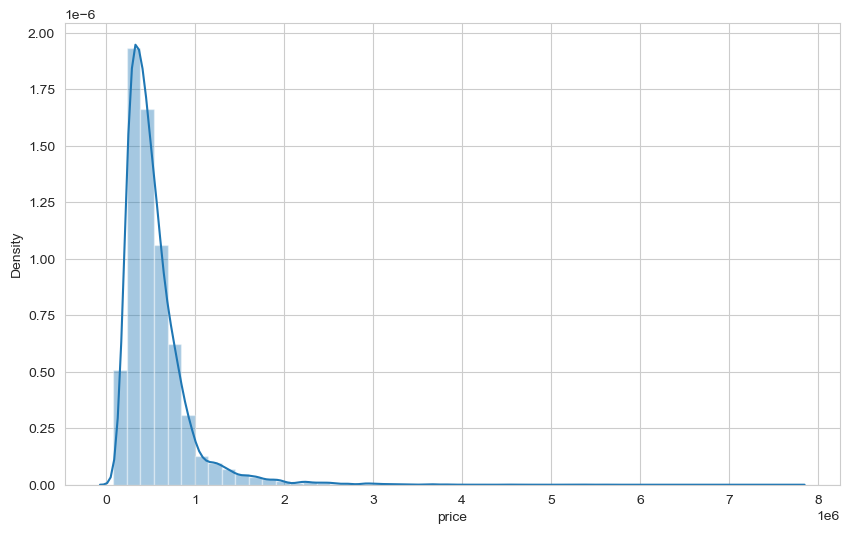

In [12]:
sns.distplot(df['price']);

In [13]:
df[df["price"] > 3000000].sort_values(by="price", ascending=False)

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
7245,10/13/2014,7700000.000,6,8.000,12050,27600,2.500,0,3,4,13,8570,3480,1910,1987,98102,47.630,-122.323,3940,8800
3910,6/11/2014,7060000.000,5,4.500,10040,37325,2.000,1,2,3,11,7680,2360,1940,2001,98004,47.650,-122.214,3930,25449
9245,9/19/2014,6890000.000,6,7.750,9890,31374,2.000,0,4,3,13,8860,1030,2001,0,98039,47.630,-122.240,4540,42730
4407,8/4/2014,5570000.000,5,5.750,9200,35069,2.000,0,0,3,13,6200,3000,2001,0,98039,47.629,-122.233,3560,24345
1446,4/13/2015,5350000.000,5,5.000,8000,23985,2.000,0,4,3,12,6720,1280,2009,0,98004,47.623,-122.220,4600,21750
1313,4/13/2015,5300000.000,6,6.000,7390,24829,2.000,1,4,4,12,5000,2390,1991,0,98040,47.563,-122.210,4320,24619
1162,10/20/2014,5110000.000,5,5.250,8010,45517,2.000,1,4,3,12,5990,2020,1999,0,98033,47.677,-122.211,3430,26788
8085,6/17/2014,4670000.000,5,6.750,9640,13068,1.000,1,4,3,12,4820,4820,1983,2009,98040,47.557,-122.210,3270,10454
2624,8/15/2014,4500000.000,5,5.500,6640,40014,2.000,1,4,3,12,6350,290,2004,0,98155,47.749,-122.280,3030,23408
8629,6/18/2014,4490000.000,4,3.000,6430,27517,2.000,0,0,3,12,6430,0,2001,0,98004,47.621,-122.219,3720,14592


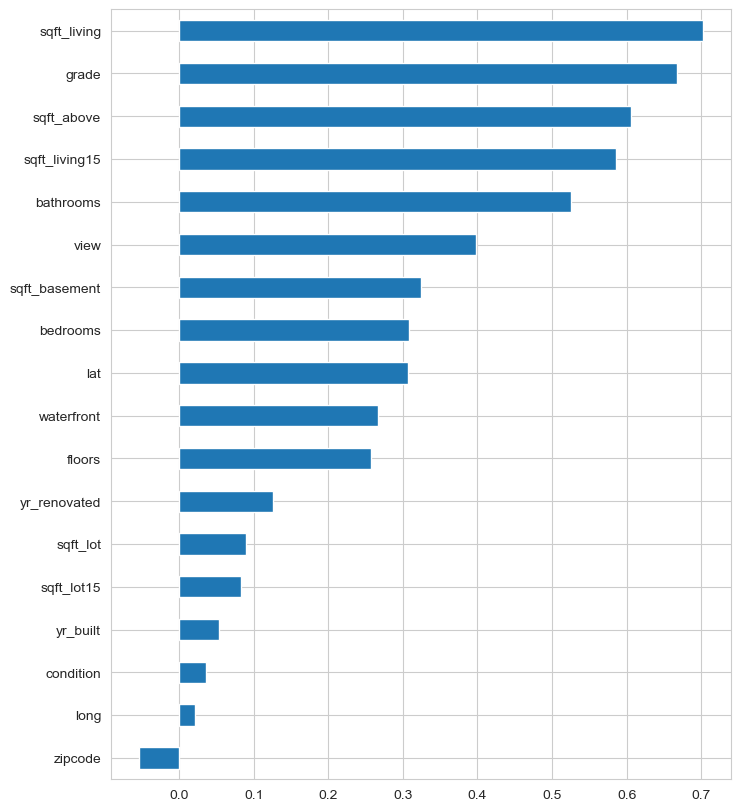

In [14]:
plt.figure(figsize = (8,10))
df.corr()["price"].sort_values().drop("price").plot(kind = "barh");

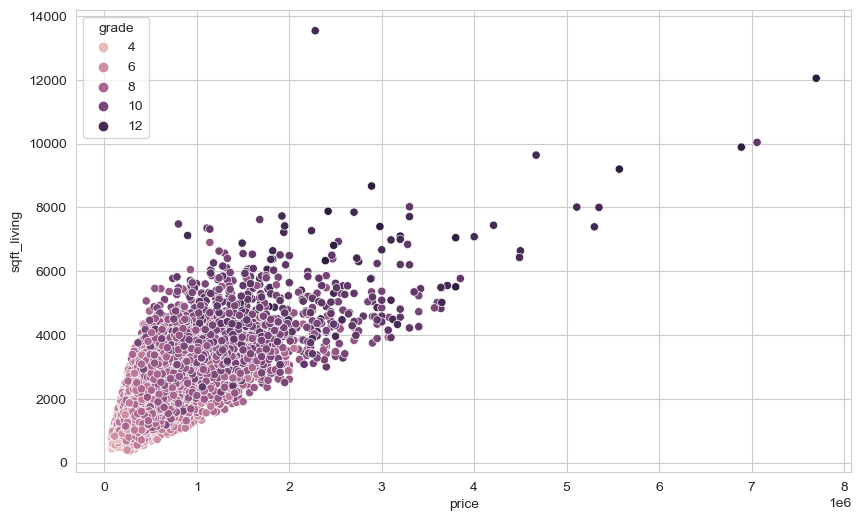

In [15]:
sns.scatterplot(x = 'price',y = 'sqft_living', data = df, hue = "grade");

### bedrooms

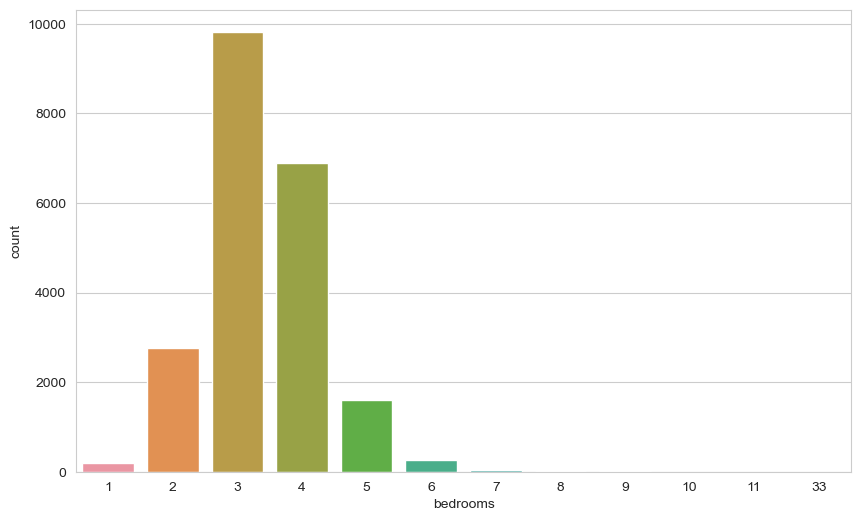

In [16]:
sns.countplot(df['bedrooms']);

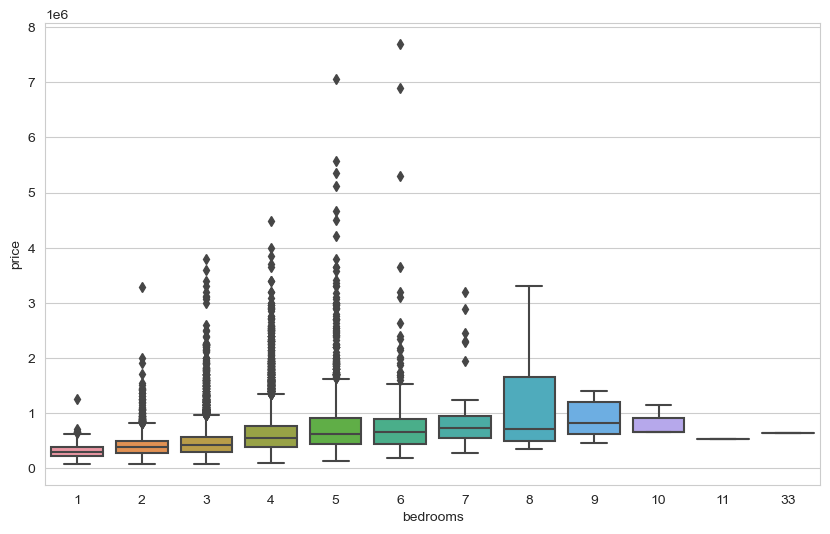

In [17]:
sns.boxplot(x = 'bedrooms', y = 'price', data = df);

In [18]:
df[df["bedrooms"] > 10]

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
8748,8/21/2014,520000.000,11,3.000,3000,4960,2.000,0,0,3,7,2400,600,1918,1999,98106,47.556,-122.363,1420,4960
15856,6/25/2014,640000.000,33,1.750,1620,6000,1.000,0,0,5,7,1040,580,1947,0,98103,47.688,-122.331,1330,4700


In [19]:
df = df[df["bedrooms"] != 33]

Most likely the data was entered incorrectly.

In [20]:
df.shape

(21596, 20)

### date

In [21]:
df['date'].dtype

dtype('O')

In [22]:
df['date'] = pd.to_datetime(df['date'])

In [23]:
df['date']

0       2014-10-13
1       2014-12-09
2       2015-02-25
3       2014-12-09
4       2015-02-18
           ...    
21592   2014-05-21
21593   2015-02-23
21594   2014-06-23
21595   2015-01-16
21596   2014-10-15
Name: date, Length: 21596, dtype: datetime64[ns]

In [24]:
df['year'] = df['date'].dt.year
#df['year'] = df['date'].apply(lambda date : date.year)

In [25]:
df['month'] = df['date'].dt.month

In [26]:
df.head()

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,year,month
0,2014-10-13,221900.000,3,1.000,1180,5650,1.000,0,0,3,7,1180,0,1955,0,98178,47.511,-122.257,1340,5650,2014,10
1,2014-12-09,538000.000,3,2.250,2570,7242,2.000,0,0,3,7,2170,400,1951,1991,98125,47.721,-122.319,1690,7639,2014,12
2,2015-02-25,180000.000,2,1.000,770,10000,1.000,0,0,3,6,770,0,1933,0,98028,47.738,-122.233,2720,8062,2015,2
3,2014-12-09,604000.000,4,3.000,1960,5000,1.000,0,0,5,7,1050,910,1965,0,98136,47.521,-122.393,1360,5000,2014,12
4,2015-02-18,510000.000,3,2.000,1680,8080,1.000,0,0,3,8,1680,0,1987,0,98074,47.617,-122.045,1800,7503,2015,2


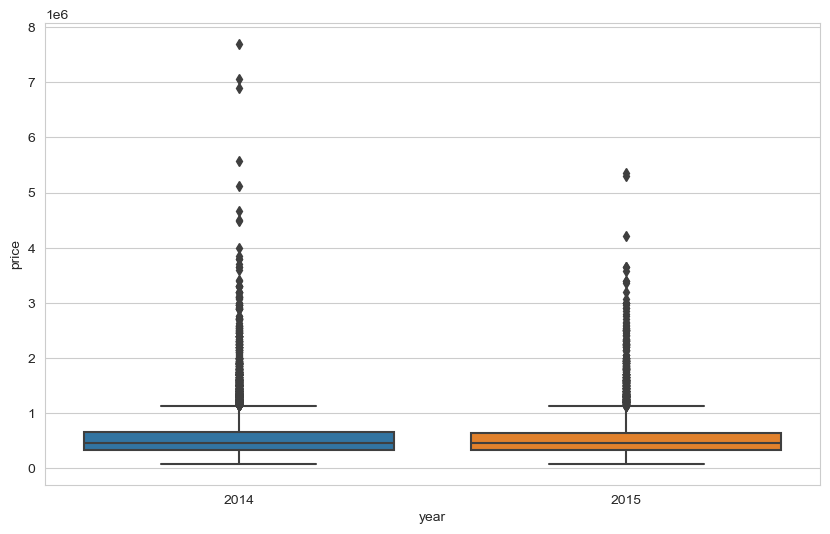

In [27]:
sns.boxplot(x = 'year', y = 'price', data = df);

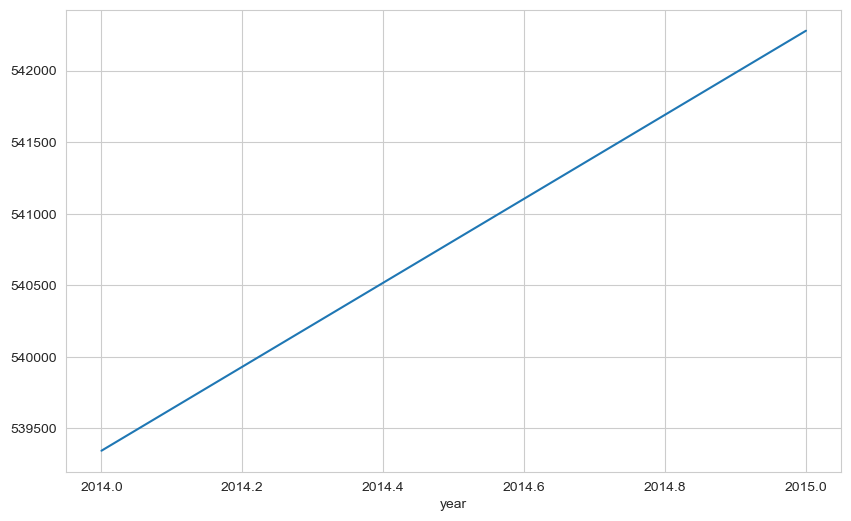

In [28]:
df.groupby('year')['price'].mean().plot();

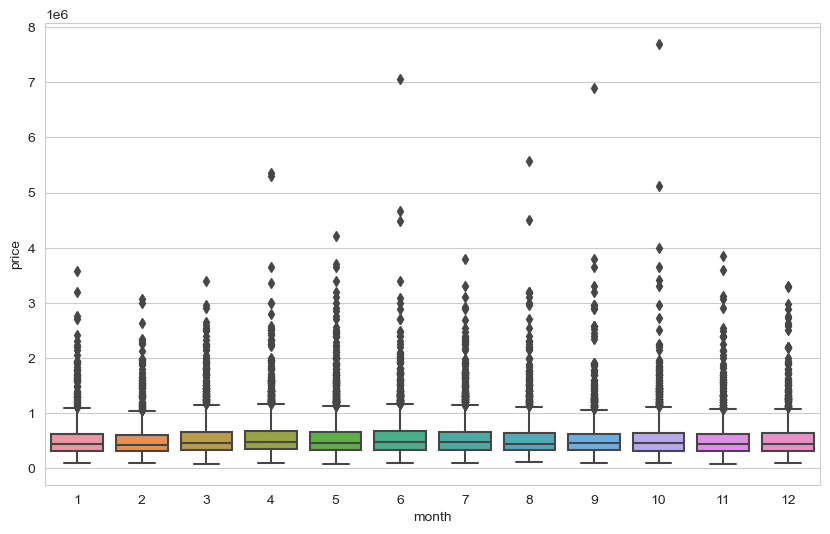

In [29]:
sns.boxplot(x = 'month', y = 'price', data = df);

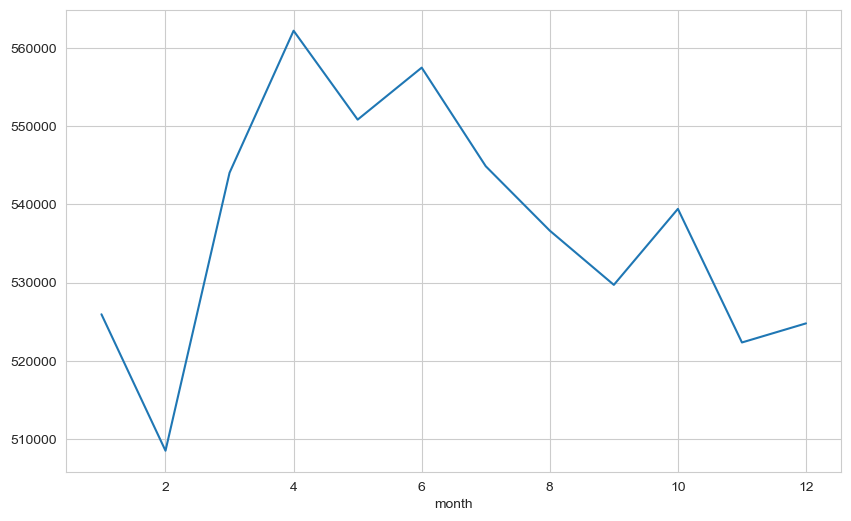

In [30]:
df.groupby('month')['price'].mean().plot();

In [31]:
# month_dummy = pd.get_dummies(df["month"], prefix = "month")
# df = pd.concat([df, month_dummy], axis = 1)
# df.head()

In [32]:
df = df.drop(['date', "year", "month"], axis = 1)

### zipcode

In [33]:
df['zipcode'].value_counts(dropna = False)

98103    601
98038    589
98115    583
98052    574
98117    553
        ... 
98102    104
98010    100
98024     80
98148     57
98039     50
Name: zipcode, Length: 70, dtype: int64

we can categorize the zipcodes as north, south, west, east, middle by regions. But it can be made manually and taken many time and we need domain knowladge to do that. So we will drop this column.

In [34]:
df = df.drop('zipcode', axis = 1)

### yr_renovated & yr_built

In [35]:
df['yr_renovated'].value_counts(dropna = False)

0       20682
2014       91
2013       37
2003       36
2005       35
        ...  
1951        1
1959        1
1948        1
1954        1
1944        1
Name: yr_renovated, Length: 70, dtype: int64

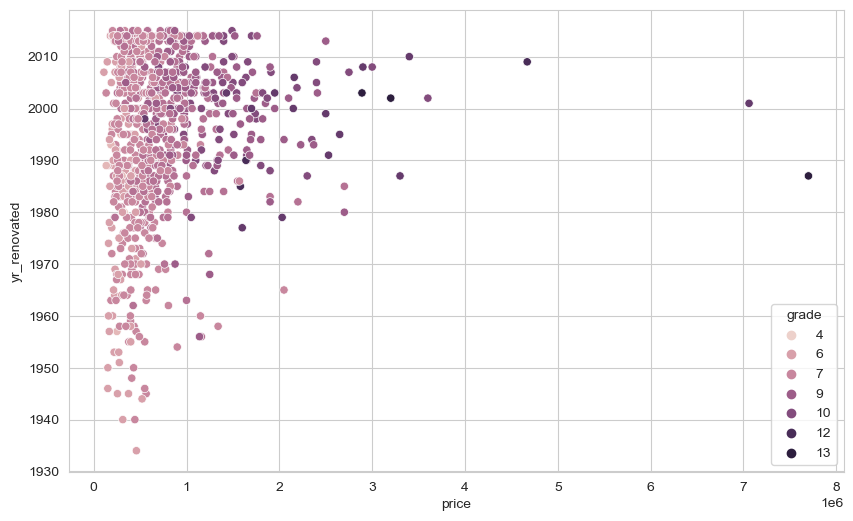

In [36]:
sns.scatterplot(x = 'price',y = 'yr_renovated', data = df[df.yr_renovated!=0], hue = "grade");

In [37]:
df['yr_built'].value_counts(dropna = False)

2014    559
2006    453
2005    450
2004    433
2003    420
       ... 
1933     30
1901     29
1902     27
1935     24
1934     21
Name: yr_built, Length: 116, dtype: int64

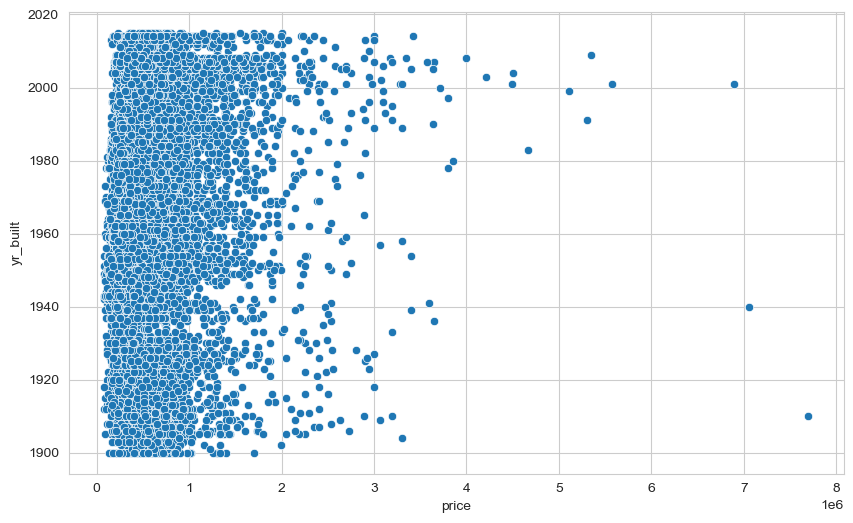

In [38]:
sns.scatterplot(x = 'price',y = 'yr_built', data = df);

In [39]:
df.yr_renovated.apply(lambda x : x if x == 0 else 1).value_counts()

0    20682
1      914
Name: yr_renovated, dtype: int64

In [40]:
df["renovated"] = df.yr_renovated.apply(lambda x : x if x == 0 else 1)

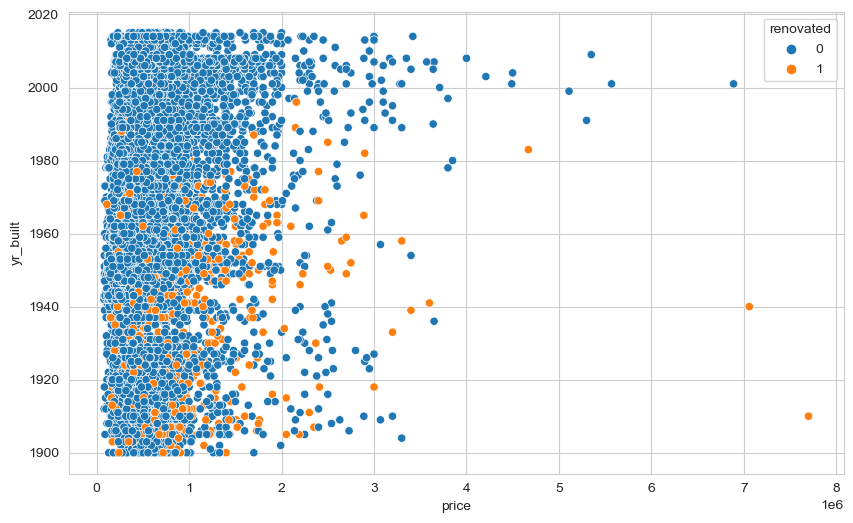

In [41]:
sns.scatterplot(x = 'price',y = 'yr_built', data = df, hue = "renovated");

In [42]:
df["built|renovated"] = df["yr_renovated"].replace(0, np.nan).fillna(df["yr_built"])
df["built|renovated"]

0       1955.000
1       1991.000
2       1933.000
3       1965.000
4       1987.000
          ...   
21592   2009.000
21593   2014.000
21594   2009.000
21595   2004.000
21596   2008.000
Name: built|renovated, Length: 21596, dtype: float64

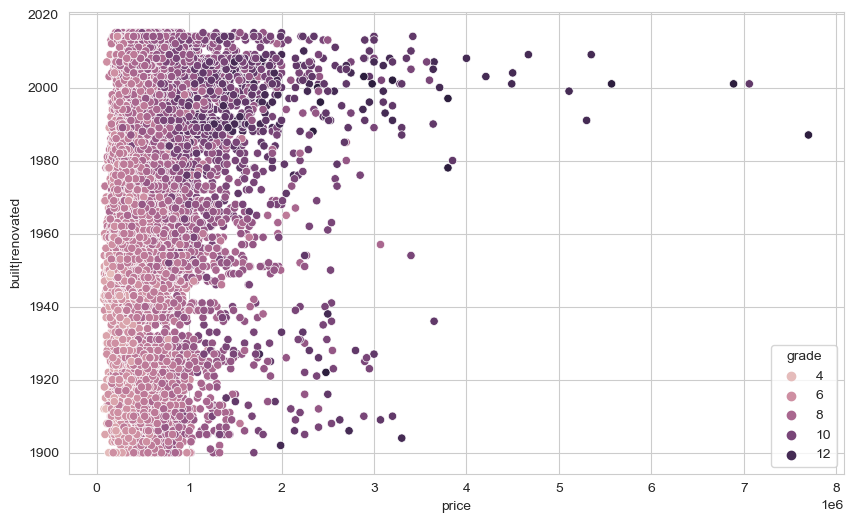

In [43]:
sns.scatterplot(x = 'price',y = 'built|renovated', data = df, hue = "grade");

In [44]:
df.drop(["yr_renovated", "yr_built", "renovated"], axis = 1, inplace = True)
# df.drop(["built|renovated", "renovated"], axis = 1, inplace = True)

could make sense due to scaling, higher should correlate to more value

### sqft_basement

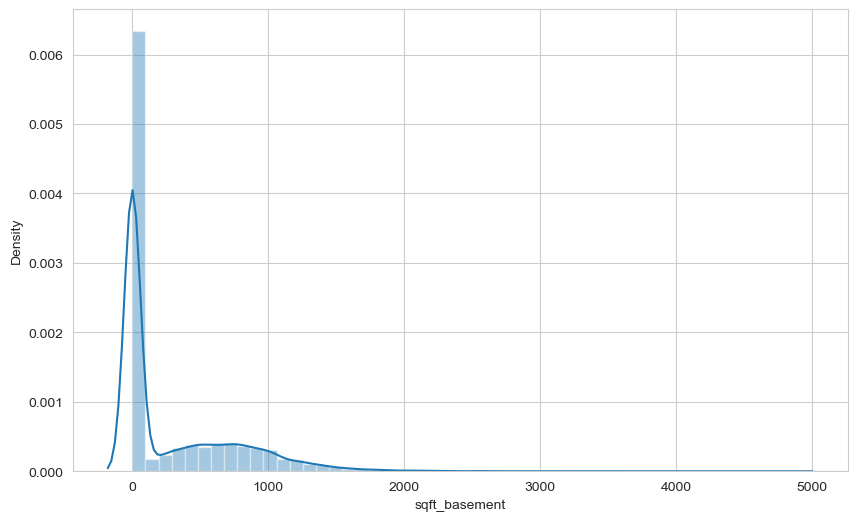

In [45]:
sns.distplot(df['sqft_basement']);

In [46]:
df[df["sqft_basement"] > 3000].sort_values(by="sqft_basement", ascending=False)

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,lat,long,sqft_living15,sqft_lot15,built|renovated
8085,4670000.000,5,6.750,9640,13068,1.000,1,4,3,12,4820,4820,47.557,-122.210,3270,10454,2009.000
12764,2280000.000,7,8.000,13540,307752,3.000,0,4,3,12,9410,4130,47.667,-121.986,4850,217800,1999.000
15468,3200000.000,4,3.250,7000,28206,1.000,1,4,4,12,3500,3500,47.593,-122.086,4913,14663,1991.000
7245,7700000.000,6,8.000,12050,27600,2.500,0,3,4,13,8570,3480,47.630,-122.323,3940,8800,1987.000
10074,1900000.000,5,4.250,6510,16471,2.000,0,3,4,11,3250,3260,47.576,-122.242,4480,16471,1980.000


could make sense due to scaling, higher should correlate to more value

### sqft_above

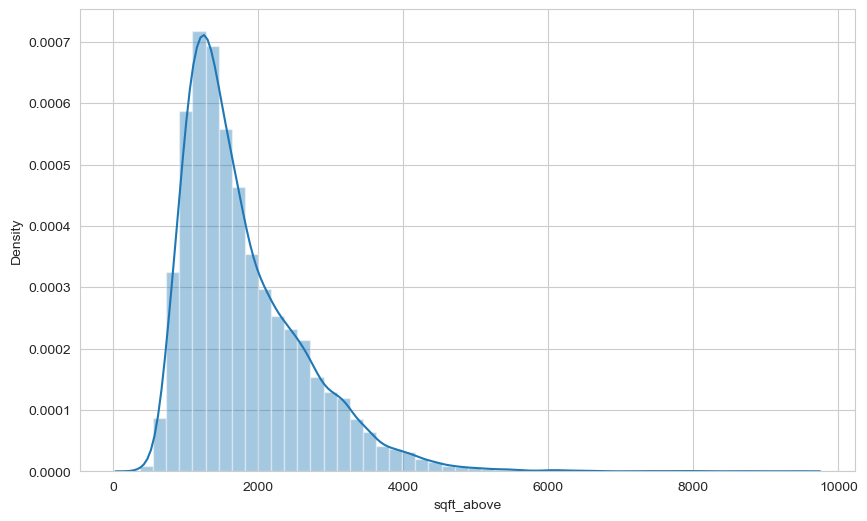

In [47]:
sns.distplot(df['sqft_above']);

In [48]:
df[df["sqft_above"] > 6000].sort_values(by="sqft_above", ascending=False)

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,lat,long,sqft_living15,sqft_lot15,built|renovated
12764,2280000.000,7,8.000,13540,307752,3.000,0,4,3,12,9410,4130,47.667,-121.986,4850,217800,1999.000
9245,6890000.000,6,7.750,9890,31374,2.000,0,4,3,13,8860,1030,47.630,-122.240,4540,42730,2001.000
7245,7700000.000,6,8.000,12050,27600,2.500,0,3,4,13,8570,3480,47.630,-122.323,3940,8800,1987.000
18288,3300000.000,5,6.250,8020,21738,2.000,0,0,3,11,8020,0,47.568,-122.189,4160,18969,2001.000
13398,2420000.000,5,4.750,7880,24250,2.000,0,2,3,13,7880,0,47.733,-122.362,2740,10761,1996.000
19842,2700000.000,4,4.000,7850,89651,2.000,0,0,3,12,7850,0,47.541,-121.982,6210,95832,2006.000
3910,7060000.000,5,4.500,10040,37325,2.000,1,2,3,11,7680,2360,47.650,-122.214,3930,25449,2001.000
11859,1950000.000,4,3.250,7420,167869,2.000,0,3,3,12,7420,0,47.455,-121.764,5610,169549,2002.000
18579,1140000.000,5,4.000,7320,217800,2.000,0,0,3,11,7320,0,47.447,-122.086,3270,34500,1992.000
1446,5350000.000,5,5.000,8000,23985,2.000,0,4,3,12,6720,1280,47.623,-122.220,4600,21750,2009.000


### Geographical Properties

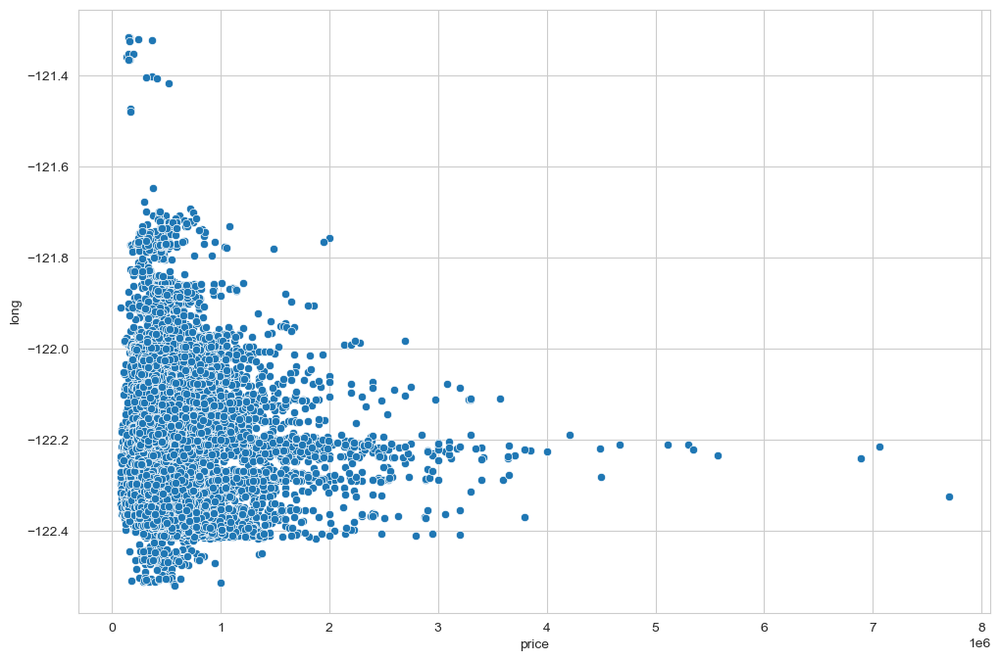

In [49]:
plt.figure(figsize = (12, 8))
sns.scatterplot(x = 'price', y = 'long', data = df);

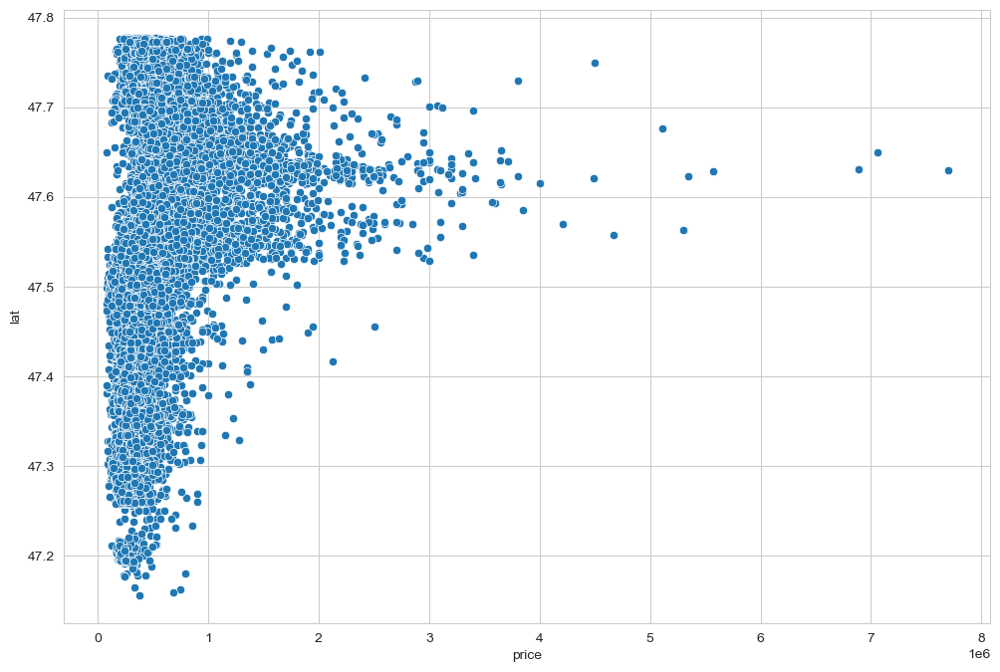

In [50]:
plt.figure(figsize  = (12, 8))
sns.scatterplot(x = 'price', y = 'lat', data = df);

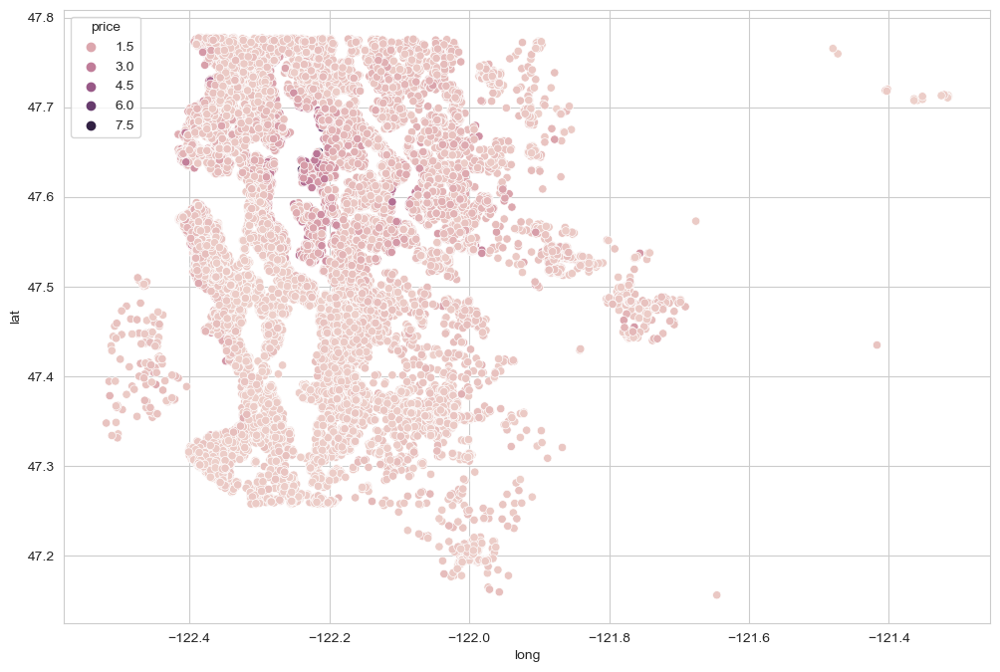

In [51]:
plt.figure(figsize = (12, 8))
sns.scatterplot(x = 'long', y = 'lat', data = df, hue = 'price');

In [52]:
len(df) * (0.01)

215.96

In [53]:
df.sort_values('price', ascending = False).head(216)

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,lat,long,sqft_living15,sqft_lot15,built|renovated
7245,7700000.000,6,8.000,12050,27600,2.500,0,3,4,13,8570,3480,47.630,-122.323,3940,8800,1987.000
3910,7060000.000,5,4.500,10040,37325,2.000,1,2,3,11,7680,2360,47.650,-122.214,3930,25449,2001.000
9245,6890000.000,6,7.750,9890,31374,2.000,0,4,3,13,8860,1030,47.630,-122.240,4540,42730,2001.000
4407,5570000.000,5,5.750,9200,35069,2.000,0,0,3,13,6200,3000,47.629,-122.233,3560,24345,2001.000
1446,5350000.000,5,5.000,8000,23985,2.000,0,4,3,12,6720,1280,47.623,-122.220,4600,21750,2009.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7408,1980000.000,6,4.500,4800,9097,2.000,0,0,3,10,3580,1220,47.626,-122.291,2180,6037,2007.000
16511,1980000.000,4,3.500,4500,44384,1.000,0,0,3,12,3340,1160,47.632,-122.192,2540,26287,1990.000
19513,1980000.000,4,4.000,4360,12081,2.000,0,0,3,10,4360,0,47.638,-122.219,2180,10800,2007.000
3278,1970000.000,5,3.750,3940,13738,1.500,0,3,4,9,3940,0,47.620,-122.212,2370,13320,1951.000


In [54]:
non_top_1_perc = df.sort_values('price', ascending = False).iloc[216:]

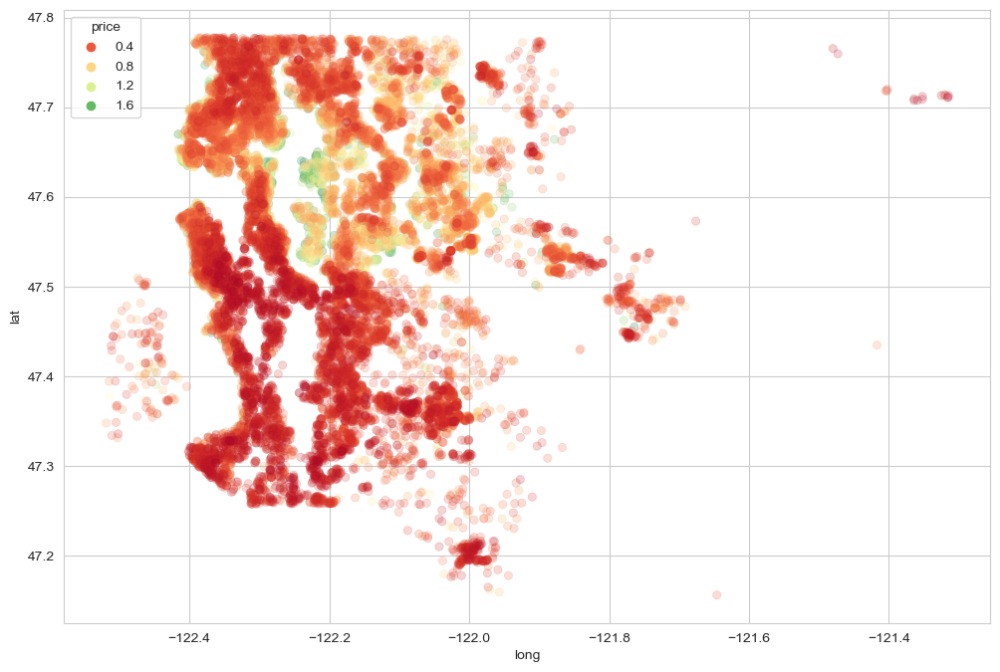

In [55]:
plt.figure(figsize = (12, 8))
sns.scatterplot(x = 'long', y = 'lat', data = non_top_1_perc, hue = 'price',
                palette = 'RdYlGn', edgecolor = None, alpha = 0.2);

In [56]:
import folium
import branca.colormap as cm

In [57]:
folium.Map(location=[df["lat"].mean(), df["long"].mean()], zoom_start=10)

In [58]:
step_1 = df.price.min()
step_2 = df.price.quantile(0.25)
step_3 = df.price.quantile(0.50)
step_4 = df.price.quantile(0.75)
step_5 = df.price.max()

In [59]:
m = folium.Map(location=[df["lat"].mean(), df["long"].mean()], zoom_start = 10)
colormap = cm.StepColormap(colors=["red","orange","yellow","green"] ,
                           index=[step_1, step_2, step_3, step_4, step_5],
                           vmin=step_1,
                           vmax=step_5)
for loc, p in zip(zip(df['lat'], df['long']),df["price"]):
      folium.Circle(
      location=loc,
      radius=1,
      fill=True, 
      color=colormap(p)
      ).add_to(m)
m

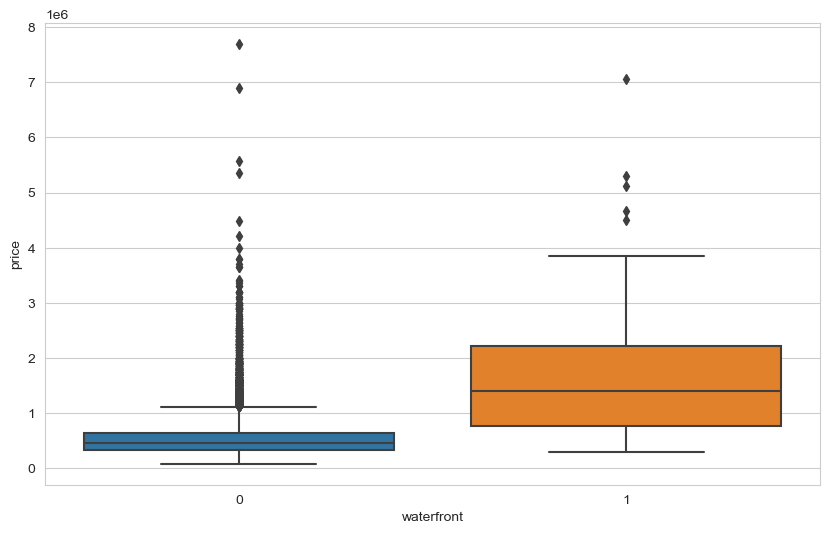

In [60]:
sns.boxplot(x = 'waterfront', y = 'price', data = df);

In [61]:
df.groupby("waterfront").price.mean()

waterfront
0    531757.274
1   1662524.184
Name: price, dtype: float64

### latest data

In [62]:
df.head()

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,lat,long,sqft_living15,sqft_lot15,built|renovated
0,221900.000,3,1.000,1180,5650,1.000,0,0,3,7,1180,0,47.511,-122.257,1340,5650,1955.000
1,538000.000,3,2.250,2570,7242,2.000,0,0,3,7,2170,400,47.721,-122.319,1690,7639,1991.000
2,180000.000,2,1.000,770,10000,1.000,0,0,3,6,770,0,47.738,-122.233,2720,8062,1933.000
3,604000.000,4,3.000,1960,5000,1.000,0,0,5,7,1050,910,47.521,-122.393,1360,5000,1965.000
4,510000.000,3,2.000,1680,8080,1.000,0,0,3,8,1680,0,47.617,-122.045,1800,7503,1987.000


In [63]:
df.shape

(21596, 17)

## Preprocessing of Data
- Train | Test Split, Scalling

In [64]:
from sklearn.model_selection import train_test_split

In [65]:
X = df.drop('price', axis = 1)
y = df['price']

In [66]:
seed = 101

In [67]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=seed)

In [68]:
from sklearn.preprocessing import MinMaxScaler  # RobustScaler()

# If there are too many outliers in the data, robust scaler should be used, otherwise minmax can be used.

In [69]:
scaler = MinMaxScaler()

In [70]:
X_train= scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

## Modelling & Model Performance

In [71]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Activation

In [72]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

In [73]:
def eval_metric(actual, pred):
    mae = mean_absolute_error(actual, pred)
    mse = mean_squared_error(actual, pred)
    rmse = np.sqrt(mean_squared_error(actual, pred))
    score = r2_score(actual, pred)
    return print("r2_score:", score, "\nmae:", mae, "\nmse:", mse, "\nrmse:", rmse)

In [74]:
X_train.shape

(19436, 16)

In [75]:
tf.random.set_seed(seed)

model = Sequential()

model.add(Dense(24, activation = 'relu', input_dim = X_train.shape[1]))
#model.add(Activation("relu")) # Activation function can be added separately as a different line after each layer.  
model.add(Dense(24, activation = 'relu'))
model.add(Dense(12, activation = 'relu'))
model.add(Dense(6, activation = 'relu'))
model.add(Dense(1))

model.compile(optimizer = 'adam', loss = 'mse')

2022-10-01 08:53:07.145547: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [76]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 24)                408       
                                                                 
 dense_1 (Dense)             (None, 24)                600       
                                                                 
 dense_2 (Dense)             (None, 12)                300       
                                                                 
 dense_3 (Dense)             (None, 6)                 78        
                                                                 
 dense_4 (Dense)             (None, 1)                 7         
                                                                 
Total params: 1,393
Trainable params: 1,393
Non-trainable params: 0
_________________________________________________________________


In [77]:
model.weights

[<tf.Variable 'dense/kernel:0' shape=(16, 24) dtype=float32, numpy=
 array([[-2.05098093e-02, -1.82524621e-01, -3.77154887e-01,
         -2.03917280e-01, -2.79870629e-03,  2.20505059e-01,
          3.75805795e-01,  1.59454823e-01, -9.35916007e-02,
         -2.16815397e-01,  1.65560722e-01,  2.94585049e-01,
          2.78829515e-01, -7.98341036e-02, -3.30619216e-02,
         -1.63366750e-01,  3.15003753e-01,  9.90016758e-02,
          6.72869682e-02, -3.02372754e-01, -7.13964105e-02,
          2.67592788e-01,  3.59416068e-01, -2.44090065e-01],
        [-8.95346999e-02,  5.14001250e-02,  1.85338080e-01,
          3.02234888e-01, -3.67724866e-01,  8.04318190e-02,
          3.26394320e-01,  4.63053882e-02,  1.18879497e-01,
          5.15573621e-02,  3.81949902e-01,  2.15500116e-01,
         -2.45495737e-01,  3.33640575e-02, -3.81739438e-01,
          1.84317648e-01, -3.54151636e-01, -9.65777636e-02,
         -1.02897644e-01,  3.13820302e-01,  9.90438759e-02,
          3.71018887e-01, -1.98

In [78]:
model.fit(x = X_train, y = y_train, validation_split = 0.15, batch_size = 128, epochs = 1000)

Epoch 1/1000
130/130 [==============================] - 1s 2ms/step - loss: 428611960832.0000 - val_loss: 423995080704.0000
Epoch 2/1000
130/130 [==============================] - 0s 934us/step - loss: 428255248384.0000 - val_loss: 422848888832.0000
Epoch 3/1000
130/130 [==============================] - 0s 968us/step - loss: 424113635328.0000 - val_loss: 413800529920.0000
Epoch 4/1000
130/130 [==============================] - 0s 956us/step - loss: 404311212032.0000 - val_loss: 379992834048.0000
Epoch 5/1000
130/130 [==============================] - 0s 989us/step - loss: 348731473920.0000 - val_loss: 302038024192.0000
Epoch 6/1000
130/130 [==============================] - 0s 1ms/step - loss: 249627426816.0000 - val_loss: 192702038016.0000
Epoch 7/1000
130/130 [==============================] - 0s 1ms/step - loss: 147480494080.0000 - val_loss: 117402132480.0000
Epoch 8/1000
130/130 [==============================] - 0s 1ms/step - loss: 100778106880.0000 - val_loss: 101064990720.0000


Epoch 67/1000
130/130 [==============================] - 0s 944us/step - loss: 44623933440.0000 - val_loss: 50829258752.0000
Epoch 68/1000
130/130 [==============================] - 0s 922us/step - loss: 44437331968.0000 - val_loss: 50597367808.0000
Epoch 69/1000
130/130 [==============================] - 0s 941us/step - loss: 44271087616.0000 - val_loss: 50397745152.0000
Epoch 70/1000
130/130 [==============================] - 0s 1ms/step - loss: 44093321216.0000 - val_loss: 50252697600.0000
Epoch 71/1000
130/130 [==============================] - 0s 1ms/step - loss: 43935014912.0000 - val_loss: 50056515584.0000
Epoch 72/1000
130/130 [==============================] - 0s 1ms/step - loss: 43728101376.0000 - val_loss: 49786327040.0000
Epoch 73/1000
130/130 [==============================] - 0s 1ms/step - loss: 43544150016.0000 - val_loss: 49596084224.0000
Epoch 74/1000
130/130 [==============================] - 0s 1ms/step - loss: 43373023232.0000 - val_loss: 49406181376.0000
Epoch 75/1

Epoch 133/1000
130/130 [==============================] - 0s 944us/step - loss: 35692433408.0000 - val_loss: 40215486464.0000
Epoch 134/1000
130/130 [==============================] - 0s 968us/step - loss: 35685818368.0000 - val_loss: 40089108480.0000
Epoch 135/1000
130/130 [==============================] - 0s 903us/step - loss: 35589165056.0000 - val_loss: 40015081472.0000
Epoch 136/1000
130/130 [==============================] - 0s 1ms/step - loss: 35524677632.0000 - val_loss: 39898324992.0000
Epoch 137/1000
130/130 [==============================] - 0s 1ms/step - loss: 35489230848.0000 - val_loss: 39885168640.0000
Epoch 138/1000
130/130 [==============================] - 0s 1ms/step - loss: 35443011584.0000 - val_loss: 39863869440.0000
Epoch 139/1000
130/130 [==============================] - 0s 1ms/step - loss: 35401031680.0000 - val_loss: 39733817344.0000
Epoch 140/1000
130/130 [==============================] - 0s 1ms/step - loss: 35350274048.0000 - val_loss: 39653863424.0000
Ep

130/130 [==============================] - 0s 909us/step - loss: 33673066496.0000 - val_loss: 37168492544.0000
Epoch 199/1000
130/130 [==============================] - 0s 909us/step - loss: 33662734336.0000 - val_loss: 37116813312.0000
Epoch 200/1000
130/130 [==============================] - 0s 949us/step - loss: 33607319552.0000 - val_loss: 37024522240.0000
Epoch 201/1000
130/130 [==============================] - 0s 977us/step - loss: 33616431104.0000 - val_loss: 37109760000.0000
Epoch 202/1000
130/130 [==============================] - 0s 900us/step - loss: 33569441792.0000 - val_loss: 37028642816.0000
Epoch 203/1000
130/130 [==============================] - 0s 931us/step - loss: 33536299008.0000 - val_loss: 36934934528.0000
Epoch 204/1000
130/130 [==============================] - 0s 944us/step - loss: 33513961472.0000 - val_loss: 36989825024.0000
Epoch 205/1000
130/130 [==============================] - 0s 916us/step - loss: 33500053504.0000 - val_loss: 36996124672.0000
Epoch 2

130/130 [==============================] - 0s 979us/step - loss: 32583280640.0000 - val_loss: 35586580480.0000
Epoch 264/1000
130/130 [==============================] - 0s 931us/step - loss: 32565157888.0000 - val_loss: 35651956736.0000
Epoch 265/1000
130/130 [==============================] - 0s 927us/step - loss: 32533108736.0000 - val_loss: 35494850560.0000
Epoch 266/1000
130/130 [==============================] - 0s 909us/step - loss: 32528617472.0000 - val_loss: 35505827840.0000
Epoch 267/1000
130/130 [==============================] - 0s 906us/step - loss: 32534722560.0000 - val_loss: 35536633856.0000
Epoch 268/1000
130/130 [==============================] - 0s 927us/step - loss: 32512313344.0000 - val_loss: 35362414592.0000
Epoch 269/1000
130/130 [==============================] - 0s 930us/step - loss: 32494946304.0000 - val_loss: 35675213824.0000
Epoch 270/1000
130/130 [==============================] - 0s 898us/step - loss: 32509435904.0000 - val_loss: 35521757184.0000
Epoch 2

130/130 [==============================] - 0s 970us/step - loss: 31897729024.0000 - val_loss: 34720489472.0000
Epoch 329/1000
130/130 [==============================] - 0s 955us/step - loss: 31901636608.0000 - val_loss: 34658021376.0000
Epoch 330/1000
130/130 [==============================] - 0s 929us/step - loss: 31869882368.0000 - val_loss: 34757906432.0000
Epoch 331/1000
130/130 [==============================] - 0s 912us/step - loss: 31862562816.0000 - val_loss: 34805846016.0000
Epoch 332/1000
130/130 [==============================] - 0s 933us/step - loss: 31862013952.0000 - val_loss: 34632982528.0000
Epoch 333/1000
130/130 [==============================] - 0s 976us/step - loss: 31863687168.0000 - val_loss: 34655576064.0000
Epoch 334/1000
130/130 [==============================] - 0s 1ms/step - loss: 31849402368.0000 - val_loss: 34588082176.0000
Epoch 335/1000
130/130 [==============================] - 0s 1ms/step - loss: 31829659648.0000 - val_loss: 34726174720.0000
Epoch 336/1

130/130 [==============================] - 0s 940us/step - loss: 31408007168.0000 - val_loss: 33998964736.0000
Epoch 394/1000
130/130 [==============================] - 0s 978us/step - loss: 31362600960.0000 - val_loss: 34177769472.0000
Epoch 395/1000
130/130 [==============================] - 0s 947us/step - loss: 31376482304.0000 - val_loss: 34049667072.0000
Epoch 396/1000
130/130 [==============================] - 0s 959us/step - loss: 31363696640.0000 - val_loss: 33983533056.0000
Epoch 397/1000
130/130 [==============================] - 0s 922us/step - loss: 31351945216.0000 - val_loss: 33993734144.0000
Epoch 398/1000
130/130 [==============================] - 0s 936us/step - loss: 31346575360.0000 - val_loss: 34049077248.0000
Epoch 399/1000
130/130 [==============================] - 0s 1ms/step - loss: 31370266624.0000 - val_loss: 34093875200.0000
Epoch 400/1000
130/130 [==============================] - 0s 927us/step - loss: 31373737984.0000 - val_loss: 34018340864.0000
Epoch 401

130/130 [==============================] - 0s 910us/step - loss: 30961637376.0000 - val_loss: 33563815936.0000
Epoch 459/1000
130/130 [==============================] - 0s 902us/step - loss: 30963292160.0000 - val_loss: 33449439232.0000
Epoch 460/1000
130/130 [==============================] - 0s 906us/step - loss: 30942232576.0000 - val_loss: 33373671424.0000
Epoch 461/1000
130/130 [==============================] - 0s 894us/step - loss: 30933823488.0000 - val_loss: 33297592320.0000
Epoch 462/1000
130/130 [==============================] - 0s 888us/step - loss: 30946881536.0000 - val_loss: 33417695232.0000
Epoch 463/1000
130/130 [==============================] - 0s 881us/step - loss: 30927284224.0000 - val_loss: 33471528960.0000
Epoch 464/1000
130/130 [==============================] - 0s 899us/step - loss: 30909956096.0000 - val_loss: 33438347264.0000
Epoch 465/1000
130/130 [==============================] - 0s 895us/step - loss: 30900279296.0000 - val_loss: 33522917376.0000
Epoch 4

130/130 [==============================] - 0s 926us/step - loss: 30550994944.0000 - val_loss: 33014069248.0000
Epoch 524/1000
130/130 [==============================] - 0s 925us/step - loss: 30567573504.0000 - val_loss: 32797906944.0000
Epoch 525/1000
130/130 [==============================] - 0s 927us/step - loss: 30536136704.0000 - val_loss: 32985352192.0000
Epoch 526/1000
130/130 [==============================] - 0s 925us/step - loss: 30532177920.0000 - val_loss: 32878553088.0000
Epoch 527/1000
130/130 [==============================] - 0s 924us/step - loss: 30518939648.0000 - val_loss: 32789084160.0000
Epoch 528/1000
130/130 [==============================] - 0s 904us/step - loss: 30548074496.0000 - val_loss: 33074864128.0000
Epoch 529/1000
130/130 [==============================] - 0s 915us/step - loss: 30494236672.0000 - val_loss: 32865755136.0000
Epoch 530/1000
130/130 [==============================] - 0s 915us/step - loss: 30492700672.0000 - val_loss: 32952143872.0000
Epoch 5

130/130 [==============================] - 0s 897us/step - loss: 30171891712.0000 - val_loss: 32412123136.0000
Epoch 589/1000
130/130 [==============================] - 0s 909us/step - loss: 30108063744.0000 - val_loss: 32397754368.0000
Epoch 590/1000
130/130 [==============================] - 0s 920us/step - loss: 30134824960.0000 - val_loss: 32396527616.0000
Epoch 591/1000
130/130 [==============================] - 0s 903us/step - loss: 30118393856.0000 - val_loss: 32287211520.0000
Epoch 592/1000
130/130 [==============================] - 0s 910us/step - loss: 30088704000.0000 - val_loss: 32235726848.0000
Epoch 593/1000
130/130 [==============================] - 0s 903us/step - loss: 30102816768.0000 - val_loss: 32377270272.0000
Epoch 594/1000
130/130 [==============================] - 0s 906us/step - loss: 30056663040.0000 - val_loss: 32173602816.0000
Epoch 595/1000
130/130 [==============================] - 0s 900us/step - loss: 30094094336.0000 - val_loss: 32218183680.0000
Epoch 5

130/130 [==============================] - 0s 999us/step - loss: 29717682176.0000 - val_loss: 32026392576.0000
Epoch 654/1000
130/130 [==============================] - 0s 937us/step - loss: 29707180032.0000 - val_loss: 32131254272.0000
Epoch 655/1000
130/130 [==============================] - 0s 926us/step - loss: 29750142976.0000 - val_loss: 31838484480.0000
Epoch 656/1000
130/130 [==============================] - 0s 1ms/step - loss: 29712101376.0000 - val_loss: 31890581504.0000
Epoch 657/1000
130/130 [==============================] - 0s 1ms/step - loss: 29729394688.0000 - val_loss: 32056438784.0000
Epoch 658/1000
130/130 [==============================] - 0s 1ms/step - loss: 29687236608.0000 - val_loss: 31904393216.0000
Epoch 659/1000
130/130 [==============================] - 0s 1ms/step - loss: 29677565952.0000 - val_loss: 31798054912.0000
Epoch 660/1000
130/130 [==============================] - 0s 1ms/step - loss: 29675599872.0000 - val_loss: 31780560896.0000
Epoch 661/1000
13

130/130 [==============================] - 0s 924us/step - loss: 29282062336.0000 - val_loss: 31583107072.0000
Epoch 719/1000
130/130 [==============================] - 0s 926us/step - loss: 29281728512.0000 - val_loss: 31584454656.0000
Epoch 720/1000
130/130 [==============================] - 0s 907us/step - loss: 29305448448.0000 - val_loss: 31391862784.0000
Epoch 721/1000
130/130 [==============================] - 0s 924us/step - loss: 29300340736.0000 - val_loss: 31506472960.0000
Epoch 722/1000
130/130 [==============================] - 0s 906us/step - loss: 29262782464.0000 - val_loss: 31512432640.0000
Epoch 723/1000
130/130 [==============================] - 0s 909us/step - loss: 29238335488.0000 - val_loss: 31613992960.0000
Epoch 724/1000
130/130 [==============================] - 0s 922us/step - loss: 29259800576.0000 - val_loss: 31517323264.0000
Epoch 725/1000
130/130 [==============================] - 0s 905us/step - loss: 29246486528.0000 - val_loss: 31484424192.0000
Epoch 7

130/130 [==============================] - 0s 928us/step - loss: 28952979456.0000 - val_loss: 31225171968.0000
Epoch 784/1000
130/130 [==============================] - 0s 934us/step - loss: 28955314176.0000 - val_loss: 31069306880.0000
Epoch 785/1000
130/130 [==============================] - 0s 981us/step - loss: 28930113536.0000 - val_loss: 31126980608.0000
Epoch 786/1000
130/130 [==============================] - 0s 946us/step - loss: 28931459072.0000 - val_loss: 31169599488.0000
Epoch 787/1000
130/130 [==============================] - 0s 1ms/step - loss: 28957988864.0000 - val_loss: 31278757888.0000
Epoch 788/1000
130/130 [==============================] - 0s 1ms/step - loss: 28923762688.0000 - val_loss: 31166527488.0000
Epoch 789/1000
130/130 [==============================] - 0s 916us/step - loss: 28917647360.0000 - val_loss: 31284604928.0000
Epoch 790/1000
130/130 [==============================] - 0s 906us/step - loss: 28904949760.0000 - val_loss: 31240429568.0000
Epoch 791/1

130/130 [==============================] - 0s 921us/step - loss: 28666286080.0000 - val_loss: 31116296192.0000
Epoch 849/1000
130/130 [==============================] - 0s 944us/step - loss: 28684533760.0000 - val_loss: 31060727808.0000
Epoch 850/1000
130/130 [==============================] - 0s 914us/step - loss: 28669304832.0000 - val_loss: 30930751488.0000
Epoch 851/1000
130/130 [==============================] - 0s 921us/step - loss: 28666007552.0000 - val_loss: 30968162304.0000
Epoch 852/1000
130/130 [==============================] - 0s 916us/step - loss: 28662382592.0000 - val_loss: 31087564800.0000
Epoch 853/1000
130/130 [==============================] - 0s 1ms/step - loss: 28665251840.0000 - val_loss: 30882093056.0000
Epoch 854/1000
130/130 [==============================] - 0s 947us/step - loss: 28625291264.0000 - val_loss: 31302565888.0000
Epoch 855/1000
130/130 [==============================] - 0s 920us/step - loss: 28656457728.0000 - val_loss: 31070150656.0000
Epoch 856

130/130 [==============================] - 0s 1ms/step - loss: 28460857344.0000 - val_loss: 30697428992.0000
Epoch 914/1000
130/130 [==============================] - 0s 1ms/step - loss: 28461656064.0000 - val_loss: 31077660672.0000
Epoch 915/1000
130/130 [==============================] - 0s 1ms/step - loss: 28424087552.0000 - val_loss: 30913046528.0000
Epoch 916/1000
130/130 [==============================] - 0s 1ms/step - loss: 28426799104.0000 - val_loss: 30742884352.0000
Epoch 917/1000
130/130 [==============================] - 0s 1ms/step - loss: 28429795328.0000 - val_loss: 30681923584.0000
Epoch 918/1000
130/130 [==============================] - 0s 1ms/step - loss: 28406507520.0000 - val_loss: 30721898496.0000
Epoch 919/1000
130/130 [==============================] - 0s 1ms/step - loss: 28416417792.0000 - val_loss: 31077036032.0000
Epoch 920/1000
130/130 [==============================] - 0s 984us/step - loss: 28429205504.0000 - val_loss: 30741487616.0000
Epoch 921/1000
130/13

130/130 [==============================] - 0s 930us/step - loss: 28204105728.0000 - val_loss: 30839814144.0000
Epoch 979/1000
130/130 [==============================] - 0s 912us/step - loss: 28205778944.0000 - val_loss: 30668208128.0000
Epoch 980/1000
130/130 [==============================] - 0s 917us/step - loss: 28198619136.0000 - val_loss: 30591391744.0000
Epoch 981/1000
130/130 [==============================] - 0s 912us/step - loss: 28220360704.0000 - val_loss: 30683267072.0000
Epoch 982/1000
130/130 [==============================] - 0s 907us/step - loss: 28210814976.0000 - val_loss: 30499543040.0000
Epoch 983/1000
130/130 [==============================] - 0s 908us/step - loss: 28219400192.0000 - val_loss: 30523783168.0000
Epoch 984/1000
130/130 [==============================] - 0s 902us/step - loss: 28219500544.0000 - val_loss: 30556874752.0000
Epoch 985/1000
130/130 [==============================] - 0s 918us/step - loss: 28191633408.0000 - val_loss: 30799484928.0000
Epoch 9

In [79]:
model.weights

[<tf.Variable 'dense/kernel:0' shape=(16, 24) dtype=float32, numpy=
 array([[-3.95773321e-01, -1.37513208e+00, -8.01761746e-01,
         -3.05894703e-01, -1.28728962e+00, -5.80501795e-01,
          7.66632438e-01, -3.97926211e-01, -3.93669069e-01,
          6.05604768e-01,  9.23164785e-02,  1.72824681e-01,
         -7.89297968e-02, -1.62648964e+00, -2.56597340e-01,
         -2.22934946e-01,  2.98203826e-01, -2.90391594e-01,
          1.84696138e-01, -2.03886223e+00, -1.29173422e+00,
         -1.77119389e-01, -8.45605060e-02, -3.75502497e-01],
        [ 6.21362746e-01,  4.94246706e-02,  8.39237571e-01,
          1.07317924e+00,  2.51920581e+00,  3.05203509e+00,
          8.37643981e-01,  5.98767877e-01,  3.04939795e+00,
         -1.20885829e-02,  3.18507612e-01, -9.12345648e-02,
          4.76855963e-01,  2.38627672e+00,  2.22300863e+00,
          1.22469038e-01, -3.70951563e-01,  3.44453406e+00,
          7.34532893e-01,  2.43290615e+00,  7.26065934e-01,
          1.06133592e+00,  4.82

In [80]:
pd.DataFrame(model.history.history)

,loss,val_loss
0,428611960832.000,423995080704.000
1,428255248384.000,422848888832.000
2,424113635328.000,413800529920.000
3,404311212032.000,379992834048.000
4,348731473920.000,302038024192.000
...,...,...
995,28183300096.000,30527358976.000
996,28169179136.000,30540910592.000
997,28170485760.000,30635950080.000
998,28150763520.000,30571137024.000


<AxesSubplot:>

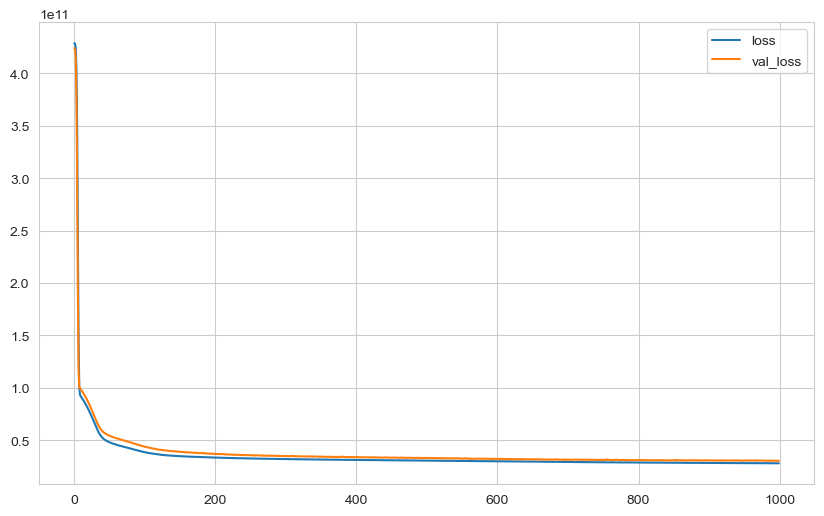

In [81]:
loss_df = pd.DataFrame(model.history.history)
loss_df.plot()

In [82]:
model.evaluate(X_test, y_test, verbose=0)

25119051776.0

In [83]:
y_pred = model.predict(X_test)

68/68 [==============================] - 0s 504us/step


In [84]:
eval_metric(y_test, y_pred)

r2_score: 0.8044902426899023 
mae: 96990.83928674768 
mse: 25119047075.590378 
rmse: 158489.89581544427


### learning_rate

In [85]:
from tensorflow.keras.optimizers import Adam

In [86]:
tf.random.set_seed(seed)

model = Sequential()

model.add(Dense(24, activation = 'relu', input_dim = X_train.shape[1]))
model.add(Dense(24, activation = 'relu'))
model.add(Dense(12, activation = 'relu'))
model.add(Dense(6, activation = 'relu'))
model.add(Dense(1))

opt = Adam(lr = 0.003) # default learning rate value is 0.001
model.compile(optimizer = opt, loss = 'mse')

In [87]:
model.weights

[<tf.Variable 'dense_5/kernel:0' shape=(16, 24) dtype=float32, numpy=
 array([[-2.05098093e-02, -1.82524621e-01, -3.77154887e-01,
         -2.03917280e-01, -2.79870629e-03,  2.20505059e-01,
          3.75805795e-01,  1.59454823e-01, -9.35916007e-02,
         -2.16815397e-01,  1.65560722e-01,  2.94585049e-01,
          2.78829515e-01, -7.98341036e-02, -3.30619216e-02,
         -1.63366750e-01,  3.15003753e-01,  9.90016758e-02,
          6.72869682e-02, -3.02372754e-01, -7.13964105e-02,
          2.67592788e-01,  3.59416068e-01, -2.44090065e-01],
        [-8.95346999e-02,  5.14001250e-02,  1.85338080e-01,
          3.02234888e-01, -3.67724866e-01,  8.04318190e-02,
          3.26394320e-01,  4.63053882e-02,  1.18879497e-01,
          5.15573621e-02,  3.81949902e-01,  2.15500116e-01,
         -2.45495737e-01,  3.33640575e-02, -3.81739438e-01,
          1.84317648e-01, -3.54151636e-01, -9.65777636e-02,
         -1.02897644e-01,  3.13820302e-01,  9.90438759e-02,
          3.71018887e-01, -1.

In [88]:
model.fit(x = X_train, y = y_train, validation_split = 0.15, batch_size = 128, epochs = 1000)

Epoch 1/1000
130/130 [==============================] - 0s 1ms/step - loss: 428187320320.0000 - val_loss: 420915216384.0000
Epoch 2/1000
130/130 [==============================] - 0s 941us/step - loss: 379481784320.0000 - val_loss: 266238705664.0000
Epoch 3/1000
130/130 [==============================] - 0s 947us/step - loss: 138398564352.0000 - val_loss: 100015783936.0000
Epoch 4/1000
130/130 [==============================] - 0s 951us/step - loss: 91282792448.0000 - val_loss: 96737460224.0000
Epoch 5/1000
130/130 [==============================] - 0s 938us/step - loss: 87961165824.0000 - val_loss: 93478608896.0000
Epoch 6/1000
130/130 [==============================] - 0s 928us/step - loss: 84483612672.0000 - val_loss: 89825189888.0000
Epoch 7/1000
130/130 [==============================] - 0s 920us/step - loss: 80868941824.0000 - val_loss: 86334676992.0000
Epoch 8/1000
130/130 [==============================] - 0s 913us/step - loss: 77045014528.0000 - val_loss: 82229510144.0000
Epoc

130/130 [==============================] - 0s 902us/step - loss: 33770264576.0000 - val_loss: 37230051328.0000
Epoch 67/1000
130/130 [==============================] - 0s 915us/step - loss: 33769011200.0000 - val_loss: 37123584000.0000
Epoch 68/1000
130/130 [==============================] - 0s 904us/step - loss: 33576001536.0000 - val_loss: 37275254784.0000
Epoch 69/1000
130/130 [==============================] - 0s 903us/step - loss: 33575180288.0000 - val_loss: 37036294144.0000
Epoch 70/1000
130/130 [==============================] - 0s 904us/step - loss: 33494480896.0000 - val_loss: 36854685696.0000
Epoch 71/1000
130/130 [==============================] - 0s 912us/step - loss: 33591044096.0000 - val_loss: 37230759936.0000
Epoch 72/1000
130/130 [==============================] - 0s 916us/step - loss: 33393889280.0000 - val_loss: 36647505920.0000
Epoch 73/1000
130/130 [==============================] - 0s 913us/step - loss: 33349615616.0000 - val_loss: 36615553024.0000
Epoch 74/1000


130/130 [==============================] - 0s 1ms/step - loss: 31529371648.0000 - val_loss: 34441736192.0000
Epoch 132/1000
130/130 [==============================] - 0s 1ms/step - loss: 31373959168.0000 - val_loss: 34130290688.0000
Epoch 133/1000
130/130 [==============================] - 0s 1ms/step - loss: 31495944192.0000 - val_loss: 33902211072.0000
Epoch 134/1000
130/130 [==============================] - 0s 1ms/step - loss: 31487653888.0000 - val_loss: 33879875584.0000
Epoch 135/1000
130/130 [==============================] - 0s 1ms/step - loss: 31421278208.0000 - val_loss: 33840211968.0000
Epoch 136/1000
130/130 [==============================] - 0s 1ms/step - loss: 31336570880.0000 - val_loss: 33715961856.0000
Epoch 137/1000
130/130 [==============================] - 0s 1ms/step - loss: 31325063168.0000 - val_loss: 33755486208.0000
Epoch 138/1000
130/130 [==============================] - 0s 1ms/step - loss: 31267596288.0000 - val_loss: 34260430848.0000
Epoch 139/1000
130/130 

Epoch 197/1000
130/130 [==============================] - 0s 1ms/step - loss: 30224453632.0000 - val_loss: 32248625152.0000
Epoch 198/1000
130/130 [==============================] - 0s 1ms/step - loss: 30329839616.0000 - val_loss: 32962822144.0000
Epoch 199/1000
130/130 [==============================] - 0s 1ms/step - loss: 30340995072.0000 - val_loss: 32410894336.0000
Epoch 200/1000
130/130 [==============================] - 0s 1ms/step - loss: 30243344384.0000 - val_loss: 32202807296.0000
Epoch 201/1000
130/130 [==============================] - 0s 1ms/step - loss: 30288160768.0000 - val_loss: 32964558848.0000
Epoch 202/1000
130/130 [==============================] - 0s 1ms/step - loss: 30219550720.0000 - val_loss: 32846852096.0000
Epoch 203/1000
130/130 [==============================] - 0s 1ms/step - loss: 30186395648.0000 - val_loss: 32190095360.0000
Epoch 204/1000
130/130 [==============================] - 0s 1ms/step - loss: 30151823360.0000 - val_loss: 32580007936.0000
Epoch 20

130/130 [==============================] - 0s 914us/step - loss: 29207226368.0000 - val_loss: 31480483840.0000
Epoch 263/1000
130/130 [==============================] - 0s 916us/step - loss: 29156653056.0000 - val_loss: 31272022016.0000
Epoch 264/1000
130/130 [==============================] - 0s 914us/step - loss: 29132251136.0000 - val_loss: 31288915968.0000
Epoch 265/1000
130/130 [==============================] - 0s 912us/step - loss: 29113800704.0000 - val_loss: 31299821568.0000
Epoch 266/1000
130/130 [==============================] - 0s 904us/step - loss: 29101746176.0000 - val_loss: 31235395584.0000
Epoch 267/1000
130/130 [==============================] - 0s 919us/step - loss: 29146408960.0000 - val_loss: 31167541248.0000
Epoch 268/1000
130/130 [==============================] - 0s 920us/step - loss: 29070127104.0000 - val_loss: 30932224000.0000
Epoch 269/1000
130/130 [==============================] - 0s 909us/step - loss: 29003896832.0000 - val_loss: 31582560256.0000
Epoch 2

130/130 [==============================] - 0s 920us/step - loss: 28284350464.0000 - val_loss: 30835814400.0000
Epoch 328/1000
130/130 [==============================] - 0s 907us/step - loss: 28277903360.0000 - val_loss: 30855290880.0000
Epoch 329/1000
130/130 [==============================] - 0s 925us/step - loss: 28266756096.0000 - val_loss: 30720428032.0000
Epoch 330/1000
130/130 [==============================] - 0s 909us/step - loss: 28239216640.0000 - val_loss: 30567815168.0000
Epoch 331/1000
130/130 [==============================] - 0s 896us/step - loss: 28282595328.0000 - val_loss: 30790455296.0000
Epoch 332/1000
130/130 [==============================] - 0s 893us/step - loss: 28238020608.0000 - val_loss: 30488588288.0000
Epoch 333/1000
130/130 [==============================] - 0s 902us/step - loss: 28173344768.0000 - val_loss: 30522818560.0000
Epoch 334/1000
130/130 [==============================] - 0s 896us/step - loss: 28214566912.0000 - val_loss: 30721294336.0000
Epoch 3

130/130 [==============================] - 0s 928us/step - loss: 27662235648.0000 - val_loss: 30316328960.0000
Epoch 393/1000
130/130 [==============================] - 0s 907us/step - loss: 27706423296.0000 - val_loss: 30539354112.0000
Epoch 394/1000
130/130 [==============================] - 0s 908us/step - loss: 27643817984.0000 - val_loss: 30305042432.0000
Epoch 395/1000
130/130 [==============================] - 0s 901us/step - loss: 27668590592.0000 - val_loss: 30140823552.0000
Epoch 396/1000
130/130 [==============================] - 0s 889us/step - loss: 27660122112.0000 - val_loss: 30037979136.0000
Epoch 397/1000
130/130 [==============================] - 0s 890us/step - loss: 27608475648.0000 - val_loss: 30849525760.0000
Epoch 398/1000
130/130 [==============================] - 0s 914us/step - loss: 27677040640.0000 - val_loss: 30192531456.0000
Epoch 399/1000
130/130 [==============================] - 0s 904us/step - loss: 27665594368.0000 - val_loss: 31253723136.0000
Epoch 4

130/130 [==============================] - 0s 1ms/step - loss: 27281903616.0000 - val_loss: 30698131456.0000
Epoch 458/1000
130/130 [==============================] - 0s 1ms/step - loss: 27291039744.0000 - val_loss: 30277359616.0000
Epoch 459/1000
130/130 [==============================] - 0s 1ms/step - loss: 27296378880.0000 - val_loss: 30213271552.0000
Epoch 460/1000
130/130 [==============================] - 0s 1ms/step - loss: 27262703616.0000 - val_loss: 30168066048.0000
Epoch 461/1000
130/130 [==============================] - 0s 1ms/step - loss: 27220865024.0000 - val_loss: 29988415488.0000
Epoch 462/1000
130/130 [==============================] - 0s 1ms/step - loss: 27236700160.0000 - val_loss: 30243543040.0000
Epoch 463/1000
130/130 [==============================] - 0s 981us/step - loss: 27252332544.0000 - val_loss: 30114936832.0000
Epoch 464/1000
130/130 [==============================] - 0s 918us/step - loss: 27207149568.0000 - val_loss: 30322585600.0000
Epoch 465/1000
130/

130/130 [==============================] - 0s 919us/step - loss: 26886574080.0000 - val_loss: 30279741440.0000
Epoch 523/1000
130/130 [==============================] - 0s 903us/step - loss: 26894446592.0000 - val_loss: 30423846912.0000
Epoch 524/1000
130/130 [==============================] - 0s 909us/step - loss: 26989981696.0000 - val_loss: 30597015552.0000
Epoch 525/1000
130/130 [==============================] - 0s 921us/step - loss: 26921314304.0000 - val_loss: 31097929728.0000
Epoch 526/1000
130/130 [==============================] - 0s 915us/step - loss: 26907662336.0000 - val_loss: 30384676864.0000
Epoch 527/1000
130/130 [==============================] - 0s 905us/step - loss: 26868473856.0000 - val_loss: 30319564800.0000
Epoch 528/1000
130/130 [==============================] - 0s 900us/step - loss: 26913681408.0000 - val_loss: 31316875264.0000
Epoch 529/1000
130/130 [==============================] - 0s 909us/step - loss: 26810943488.0000 - val_loss: 30650603520.0000
Epoch 5

130/130 [==============================] - 0s 893us/step - loss: 22712561664.0000 - val_loss: 26592010240.0000
Epoch 588/1000
130/130 [==============================] - 0s 891us/step - loss: 22560454656.0000 - val_loss: 26522419200.0000
Epoch 589/1000
130/130 [==============================] - 0s 911us/step - loss: 22382383104.0000 - val_loss: 26399889408.0000
Epoch 590/1000
130/130 [==============================] - 0s 927us/step - loss: 22270113792.0000 - val_loss: 26157725696.0000
Epoch 591/1000
130/130 [==============================] - 0s 918us/step - loss: 22255247360.0000 - val_loss: 26054043648.0000
Epoch 592/1000
130/130 [==============================] - 0s 910us/step - loss: 22035136512.0000 - val_loss: 25681303552.0000
Epoch 593/1000
130/130 [==============================] - 0s 903us/step - loss: 21901090816.0000 - val_loss: 26160379904.0000
Epoch 594/1000
130/130 [==============================] - 0s 911us/step - loss: 21742479360.0000 - val_loss: 25357111296.0000
Epoch 5

130/130 [==============================] - 0s 895us/step - loss: 19401273344.0000 - val_loss: 23807023104.0000
Epoch 653/1000
130/130 [==============================] - 0s 907us/step - loss: 19560347648.0000 - val_loss: 24172449792.0000
Epoch 654/1000
130/130 [==============================] - 0s 917us/step - loss: 19453081600.0000 - val_loss: 24506271744.0000
Epoch 655/1000
130/130 [==============================] - 0s 925us/step - loss: 19522783232.0000 - val_loss: 23894157312.0000
Epoch 656/1000
130/130 [==============================] - 0s 914us/step - loss: 19406428160.0000 - val_loss: 24711835648.0000
Epoch 657/1000
130/130 [==============================] - 0s 907us/step - loss: 19353616384.0000 - val_loss: 24190150656.0000
Epoch 658/1000
130/130 [==============================] - 0s 916us/step - loss: 19251185664.0000 - val_loss: 23712602112.0000
Epoch 659/1000
130/130 [==============================] - 0s 900us/step - loss: 19297427456.0000 - val_loss: 23687651328.0000
Epoch 6

130/130 [==============================] - 0s 1ms/step - loss: 17044253696.0000 - val_loss: 22079619072.0000
Epoch 718/1000
130/130 [==============================] - 0s 1ms/step - loss: 16996033536.0000 - val_loss: 23078156288.0000
Epoch 719/1000
130/130 [==============================] - 0s 998us/step - loss: 17075371008.0000 - val_loss: 22367348736.0000
Epoch 720/1000
130/130 [==============================] - 0s 955us/step - loss: 17176587264.0000 - val_loss: 22389098496.0000
Epoch 721/1000
130/130 [==============================] - 0s 1ms/step - loss: 17397291008.0000 - val_loss: 22364979200.0000
Epoch 722/1000
130/130 [==============================] - 0s 930us/step - loss: 16876888064.0000 - val_loss: 22111328256.0000
Epoch 723/1000
130/130 [==============================] - 0s 1ms/step - loss: 16942612480.0000 - val_loss: 22035863552.0000
Epoch 724/1000
130/130 [==============================] - 0s 1ms/step - loss: 16877918208.0000 - val_loss: 21954492416.0000
Epoch 725/1000
13

130/130 [==============================] - 0s 1ms/step - loss: 15369012224.0000 - val_loss: 21018032128.0000
Epoch 783/1000
130/130 [==============================] - 0s 1ms/step - loss: 15423581184.0000 - val_loss: 20892274688.0000
Epoch 784/1000
130/130 [==============================] - 0s 1ms/step - loss: 15834591232.0000 - val_loss: 20909924352.0000
Epoch 785/1000
130/130 [==============================] - 0s 1ms/step - loss: 15320895488.0000 - val_loss: 20765894656.0000
Epoch 786/1000
130/130 [==============================] - 0s 1ms/step - loss: 15376063488.0000 - val_loss: 21264007168.0000
Epoch 787/1000
130/130 [==============================] - 0s 1ms/step - loss: 15404808192.0000 - val_loss: 20848805888.0000
Epoch 788/1000
130/130 [==============================] - 0s 1ms/step - loss: 15328858112.0000 - val_loss: 20464054272.0000
Epoch 789/1000
130/130 [==============================] - 0s 1ms/step - loss: 15357918208.0000 - val_loss: 20689307648.0000
Epoch 790/1000
130/130 

Epoch 848/1000
130/130 [==============================] - 0s 1ms/step - loss: 14559454208.0000 - val_loss: 20392263680.0000
Epoch 849/1000
130/130 [==============================] - 0s 1ms/step - loss: 14844568576.0000 - val_loss: 20101855232.0000
Epoch 850/1000
130/130 [==============================] - 0s 1000us/step - loss: 14596239360.0000 - val_loss: 19892967424.0000
Epoch 851/1000
130/130 [==============================] - 0s 980us/step - loss: 14501208064.0000 - val_loss: 20165472256.0000
Epoch 852/1000
130/130 [==============================] - 0s 1ms/step - loss: 14507611136.0000 - val_loss: 20129402880.0000
Epoch 853/1000
130/130 [==============================] - 0s 1ms/step - loss: 14533822464.0000 - val_loss: 19777923072.0000
Epoch 854/1000
130/130 [==============================] - 0s 1ms/step - loss: 14554614784.0000 - val_loss: 20327720960.0000
Epoch 855/1000
130/130 [==============================] - 0s 1ms/step - loss: 14477276160.0000 - val_loss: 20317130752.0000
Epo

130/130 [==============================] - 0s 1ms/step - loss: 14179608576.0000 - val_loss: 19600648192.0000
Epoch 914/1000
130/130 [==============================] - 0s 1ms/step - loss: 14303295488.0000 - val_loss: 19720679424.0000
Epoch 915/1000
130/130 [==============================] - 0s 1ms/step - loss: 14043254784.0000 - val_loss: 19574401024.0000
Epoch 916/1000
130/130 [==============================] - 0s 1ms/step - loss: 14062517248.0000 - val_loss: 19391983616.0000
Epoch 917/1000
130/130 [==============================] - 0s 932us/step - loss: 14069999616.0000 - val_loss: 19630329856.0000
Epoch 918/1000
130/130 [==============================] - 0s 928us/step - loss: 14124338176.0000 - val_loss: 19833694208.0000
Epoch 919/1000
130/130 [==============================] - 0s 1ms/step - loss: 14023334912.0000 - val_loss: 19673286656.0000
Epoch 920/1000
130/130 [==============================] - 0s 1ms/step - loss: 14102142976.0000 - val_loss: 19755552768.0000
Epoch 921/1000
130/

130/130 [==============================] - 0s 1ms/step - loss: 13797763072.0000 - val_loss: 19651928064.0000
Epoch 979/1000
130/130 [==============================] - 0s 1ms/step - loss: 13936424960.0000 - val_loss: 19325388800.0000
Epoch 980/1000
130/130 [==============================] - 0s 1ms/step - loss: 13907295232.0000 - val_loss: 19347638272.0000
Epoch 981/1000
130/130 [==============================] - 0s 976us/step - loss: 13771674624.0000 - val_loss: 19741675520.0000
Epoch 982/1000
130/130 [==============================] - 0s 915us/step - loss: 13670624256.0000 - val_loss: 18939373568.0000
Epoch 983/1000
130/130 [==============================] - 0s 950us/step - loss: 13825981440.0000 - val_loss: 19156899840.0000
Epoch 984/1000
130/130 [==============================] - 0s 936us/step - loss: 13729585152.0000 - val_loss: 18908289024.0000
Epoch 985/1000
130/130 [==============================] - 0s 924us/step - loss: 13788647424.0000 - val_loss: 19773468672.0000
Epoch 986/100

<AxesSubplot:>

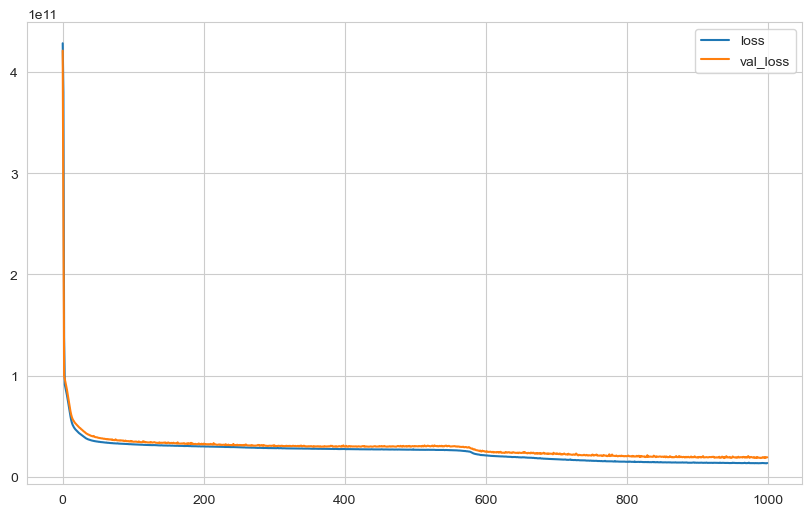

In [89]:
loss_df = pd.DataFrame(model.history.history)
loss_df.plot()

In [90]:
y_pred = model.predict(X_test)

68/68 [==============================] - 0s 502us/step


In [91]:
eval_metric(y_test, y_pred)

r2_score: 0.8905156505921327 
mae: 72970.98082682291 
mse: 14066523147.766018 
rmse: 118602.37412364905


### EarlyStopping

In [92]:
from tensorflow.keras.callbacks import EarlyStopping

In [93]:
tf.random.set_seed(seed)

model = Sequential()

model.add(Dense(24, activation = 'relu', input_dim = X_train.shape[1]))
model.add(Dense(24, activation = 'relu'))
model.add(Dense(12, activation = 'relu'))
model.add(Dense(6, activation = 'relu'))
model.add(Dense(1))

opt = Adam(lr = 0.003)
model.compile(optimizer = opt, loss = 'mse')

In [94]:
early_stop = EarlyStopping(monitor = "val_loss", mode = "min", verbose = 1, patience = 25, restore_best_weights = True)

In [95]:
model.fit(x = X_train, y = y_train, validation_split = 0.15, batch_size = 128, epochs = 1000, callbacks = [early_stop])

Epoch 1/1000
130/130 [==============================] - 0s 1ms/step - loss: 428187320320.0000 - val_loss: 420915216384.0000
Epoch 2/1000
130/130 [==============================] - 0s 933us/step - loss: 379481784320.0000 - val_loss: 266238705664.0000
Epoch 3/1000
130/130 [==============================] - 0s 935us/step - loss: 138398564352.0000 - val_loss: 100015783936.0000
Epoch 4/1000
130/130 [==============================] - 0s 952us/step - loss: 91282792448.0000 - val_loss: 96737460224.0000
Epoch 5/1000
130/130 [==============================] - 0s 930us/step - loss: 87961165824.0000 - val_loss: 93478608896.0000
Epoch 6/1000
130/130 [==============================] - 0s 933us/step - loss: 84483612672.0000 - val_loss: 89825189888.0000
Epoch 7/1000
130/130 [==============================] - 0s 932us/step - loss: 80868941824.0000 - val_loss: 86334676992.0000
Epoch 8/1000
130/130 [==============================] - 0s 936us/step - loss: 77045014528.0000 - val_loss: 82229510144.0000
Epoc

130/130 [==============================] - 0s 1ms/step - loss: 33769011200.0000 - val_loss: 37123584000.0000
Epoch 68/1000
130/130 [==============================] - 0s 1ms/step - loss: 33576001536.0000 - val_loss: 37275254784.0000
Epoch 69/1000
130/130 [==============================] - 0s 937us/step - loss: 33575180288.0000 - val_loss: 37036294144.0000
Epoch 70/1000
130/130 [==============================] - 0s 935us/step - loss: 33494480896.0000 - val_loss: 36854685696.0000
Epoch 71/1000
130/130 [==============================] - 0s 930us/step - loss: 33591044096.0000 - val_loss: 37230759936.0000
Epoch 72/1000
130/130 [==============================] - 0s 933us/step - loss: 33393889280.0000 - val_loss: 36647505920.0000
Epoch 73/1000
130/130 [==============================] - 0s 904us/step - loss: 33349615616.0000 - val_loss: 36615553024.0000
Epoch 74/1000
130/130 [==============================] - 0s 929us/step - loss: 33311703040.0000 - val_loss: 36557901824.0000
Epoch 75/1000
130/

130/130 [==============================] - 0s 934us/step - loss: 31373959168.0000 - val_loss: 34130290688.0000
Epoch 133/1000
130/130 [==============================] - 0s 922us/step - loss: 31495944192.0000 - val_loss: 33902211072.0000
Epoch 134/1000
130/130 [==============================] - 0s 946us/step - loss: 31487653888.0000 - val_loss: 33879875584.0000
Epoch 135/1000
130/130 [==============================] - 0s 915us/step - loss: 31421278208.0000 - val_loss: 33840211968.0000
Epoch 136/1000
130/130 [==============================] - 0s 909us/step - loss: 31336570880.0000 - val_loss: 33715961856.0000
Epoch 137/1000
130/130 [==============================] - 0s 918us/step - loss: 31325063168.0000 - val_loss: 33755486208.0000
Epoch 138/1000
130/130 [==============================] - 0s 919us/step - loss: 31267596288.0000 - val_loss: 34260430848.0000
Epoch 139/1000
130/130 [==============================] - 0s 927us/step - loss: 31332474880.0000 - val_loss: 33808578560.0000
Epoch 1

130/130 [==============================] - 0s 1ms/step - loss: 30224453632.0000 - val_loss: 32248625152.0000
Epoch 198/1000
130/130 [==============================] - 0s 1ms/step - loss: 30329839616.0000 - val_loss: 32962822144.0000
Epoch 199/1000
130/130 [==============================] - 0s 1ms/step - loss: 30340995072.0000 - val_loss: 32410894336.0000
Epoch 200/1000
130/130 [==============================] - 0s 1ms/step - loss: 30243344384.0000 - val_loss: 32202807296.0000
Epoch 201/1000
130/130 [==============================] - 0s 1ms/step - loss: 30288160768.0000 - val_loss: 32964558848.0000
Epoch 202/1000
130/130 [==============================] - 0s 987us/step - loss: 30219550720.0000 - val_loss: 32846852096.0000
Epoch 203/1000
130/130 [==============================] - 0s 1ms/step - loss: 30186395648.0000 - val_loss: 32190095360.0000
Epoch 204/1000
130/130 [==============================] - 0s 1ms/step - loss: 30151823360.0000 - val_loss: 32580007936.0000
Epoch 205/1000
130/13

130/130 [==============================] - 0s 917us/step - loss: 29207226368.0000 - val_loss: 31480483840.0000
Epoch 263/1000
130/130 [==============================] - 0s 911us/step - loss: 29156653056.0000 - val_loss: 31272022016.0000
Epoch 264/1000
130/130 [==============================] - 0s 911us/step - loss: 29132251136.0000 - val_loss: 31288915968.0000
Epoch 265/1000
130/130 [==============================] - 0s 913us/step - loss: 29113800704.0000 - val_loss: 31299821568.0000
Epoch 266/1000
130/130 [==============================] - 0s 892us/step - loss: 29101746176.0000 - val_loss: 31235395584.0000
Epoch 267/1000
130/130 [==============================] - 0s 907us/step - loss: 29146408960.0000 - val_loss: 31167541248.0000
Epoch 268/1000
130/130 [==============================] - 0s 1ms/step - loss: 29070127104.0000 - val_loss: 30932224000.0000
Epoch 269/1000
130/130 [==============================] - 0s 921us/step - loss: 29003896832.0000 - val_loss: 31582560256.0000
Epoch 270

130/130 [==============================] - 0s 929us/step - loss: 28284350464.0000 - val_loss: 30835814400.0000
Epoch 328/1000
130/130 [==============================] - 0s 944us/step - loss: 28277903360.0000 - val_loss: 30855290880.0000
Epoch 329/1000
130/130 [==============================] - 0s 912us/step - loss: 28266756096.0000 - val_loss: 30720428032.0000
Epoch 330/1000
130/130 [==============================] - 0s 921us/step - loss: 28239216640.0000 - val_loss: 30567815168.0000
Epoch 331/1000
130/130 [==============================] - 0s 937us/step - loss: 28282595328.0000 - val_loss: 30790455296.0000
Epoch 332/1000
130/130 [==============================] - 0s 1ms/step - loss: 28238020608.0000 - val_loss: 30488588288.0000
Epoch 333/1000
130/130 [==============================] - 0s 908us/step - loss: 28173344768.0000 - val_loss: 30522818560.0000
Epoch 334/1000
130/130 [==============================] - 0s 1ms/step - loss: 28214566912.0000 - val_loss: 30721294336.0000
Epoch 335/1

130/130 [==============================] - 0s 923us/step - loss: 27662235648.0000 - val_loss: 30316328960.0000
Epoch 393/1000
130/130 [==============================] - 0s 914us/step - loss: 27706423296.0000 - val_loss: 30539354112.0000
Epoch 394/1000
130/130 [==============================] - 0s 916us/step - loss: 27643817984.0000 - val_loss: 30305042432.0000
Epoch 395/1000
130/130 [==============================] - 0s 905us/step - loss: 27668590592.0000 - val_loss: 30140823552.0000
Epoch 396/1000
130/130 [==============================] - 0s 920us/step - loss: 27660122112.0000 - val_loss: 30037979136.0000
Epoch 397/1000
130/130 [==============================] - 0s 928us/step - loss: 27608475648.0000 - val_loss: 30849525760.0000
Epoch 398/1000
130/130 [==============================] - 0s 901us/step - loss: 27677040640.0000 - val_loss: 30192531456.0000
Epoch 399/1000
130/130 [==============================] - 0s 888us/step - loss: 27665594368.0000 - val_loss: 31253723136.0000
Epoch 4

130/130 [==============================] - 0s 976us/step - loss: 27281903616.0000 - val_loss: 30698131456.0000
Epoch 458/1000
130/130 [==============================] - 0s 902us/step - loss: 27291039744.0000 - val_loss: 30277359616.0000
Epoch 459/1000
130/130 [==============================] - 0s 947us/step - loss: 27296378880.0000 - val_loss: 30213271552.0000
Epoch 460/1000
130/130 [==============================] - 0s 1ms/step - loss: 27262703616.0000 - val_loss: 30168066048.0000
Epoch 460: early stopping


<AxesSubplot:>

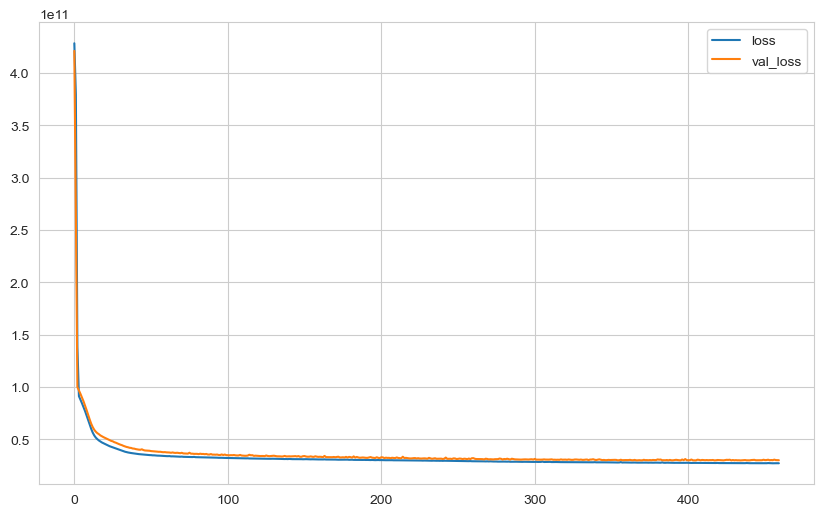

In [96]:
loss_df = pd.DataFrame(model.history.history)
loss_df.plot()

In [97]:
y_pred = model.predict(X_test)

68/68 [==============================] - 0s 512us/step


In [98]:
eval_metric(y_test, y_pred)

r2_score: 0.8100941174824119 
mae: 96030.6146412037 
mse: 24399062576.32318 
rmse: 156201.99286924346


### Dropout

The Dropout layer randomly sets input units to 0 with a frequency of `rate`
at each step during training time, which helps prevent overfitting.

Dropout refers to ignoring units (i.e. neurons) during the training phase of certain set of neurons which is chosen at random. By “ignoring”, I mean these units are not considered during a particular forward or backward pass.

For each hidden layer, for each training sample, for each iteration, ignore (zero out) a random fraction, p, of nodes (and corresponding activations).

![dropout.PNG](https://miro.medium.com/max/1400/1*nty4xtm9UBuWLqxHVaamjw.png)
[Source-1](https://medium.com/@amarbudhiraja/https-medium-com-amarbudhiraja-learning-less-to-learn-better-dropout-in-deep-machine-learning-74334da4bfc5)
[Source-2](https://medium.com/unpackai/introduction-of-dropout-and-ensemble-model-in-the-history-of-deep-learning-a4c2a512dcca)

In [99]:
from tensorflow.keras.layers import Dropout

In [100]:
tf.random.set_seed(seed)

model = Sequential()

model.add(Dense(24, activation = 'relu', input_dim = X_train.shape[1]))
model.add(Dropout(0.2))
model.add(Dense(24, activation = 'relu'))
model.add(Dropout(0.2))
model.add(Dense(12, activation = 'relu'))
model.add(Dropout(0.2))
model.add(Dense(6, activation = 'relu'))
model.add(Dropout(0.2))
model.add(Dense(1))

opt = Adam(lr = 0.003)
model.compile(optimizer = opt, loss = 'mse')

In [101]:
early_stop = EarlyStopping(monitor = "val_loss", mode = "min", verbose = 1, patience = 25, restore_best_weights = True)

In [102]:
model.fit(x = X_train, y = y_train, validation_split = 0.15, batch_size = 128, epochs = 1000, callbacks = [early_stop])

Epoch 1/1000
130/130 [==============================] - 0s 2ms/step - loss: 427606441984.0000 - val_loss: 415625183232.0000
Epoch 2/1000
130/130 [==============================] - 0s 1ms/step - loss: 296434565120.0000 - val_loss: 108082184192.0000
Epoch 3/1000
130/130 [==============================] - 0s 1ms/step - loss: 133132435456.0000 - val_loss: 101139259392.0000
Epoch 4/1000
130/130 [==============================] - 0s 1ms/step - loss: 127097782272.0000 - val_loss: 95764029440.0000
Epoch 5/1000
130/130 [==============================] - 0s 1ms/step - loss: 123766521856.0000 - val_loss: 90273587200.0000
Epoch 6/1000
130/130 [==============================] - 0s 1ms/step - loss: 118453698560.0000 - val_loss: 85989539840.0000
Epoch 7/1000
130/130 [==============================] - 0s 1ms/step - loss: 113359372288.0000 - val_loss: 79088992256.0000
Epoch 8/1000
130/130 [==============================] - 0s 1ms/step - loss: 109658521600.0000 - val_loss: 73468887040.0000
Epoch 9/1000


130/130 [==============================] - 0s 1ms/step - loss: 72886337536.0000 - val_loss: 40993382400.0000
Epoch 68/1000
130/130 [==============================] - 0s 1ms/step - loss: 72587091968.0000 - val_loss: 39403679744.0000
Epoch 69/1000
130/130 [==============================] - 0s 1ms/step - loss: 73120456704.0000 - val_loss: 40245178368.0000
Epoch 70/1000
130/130 [==============================] - 0s 1ms/step - loss: 75517157376.0000 - val_loss: 40053190656.0000
Epoch 71/1000
130/130 [==============================] - 0s 1ms/step - loss: 71133011968.0000 - val_loss: 39210102784.0000
Epoch 72/1000
130/130 [==============================] - 0s 1ms/step - loss: 72134393856.0000 - val_loss: 40783712256.0000
Epoch 73/1000
130/130 [==============================] - 0s 1ms/step - loss: 74176880640.0000 - val_loss: 39574597632.0000
Epoch 74/1000
130/130 [==============================] - 0s 1ms/step - loss: 74257809408.0000 - val_loss: 40324169728.0000
Epoch 75/1000
130/130 [=======

130/130 [==============================] - 0s 1ms/step - loss: 72682192896.0000 - val_loss: 38615461888.0000
Epoch 134/1000
130/130 [==============================] - 0s 1ms/step - loss: 73575809024.0000 - val_loss: 38573068288.0000
Epoch 135/1000
130/130 [==============================] - 0s 1ms/step - loss: 70757720064.0000 - val_loss: 36549001216.0000
Epoch 136/1000
130/130 [==============================] - 0s 1ms/step - loss: 72178769920.0000 - val_loss: 38340284416.0000
Epoch 137/1000
130/130 [==============================] - 0s 1ms/step - loss: 69050589184.0000 - val_loss: 36721487872.0000
Epoch 138/1000
130/130 [==============================] - 0s 1ms/step - loss: 71061323776.0000 - val_loss: 35929075712.0000
Epoch 139/1000
130/130 [==============================] - 0s 1ms/step - loss: 68300550144.0000 - val_loss: 35619446784.0000
Epoch 140/1000
130/130 [==============================] - 0s 1ms/step - loss: 71091118080.0000 - val_loss: 41044037632.0000
Epoch 141/1000
130/130 

<AxesSubplot:>

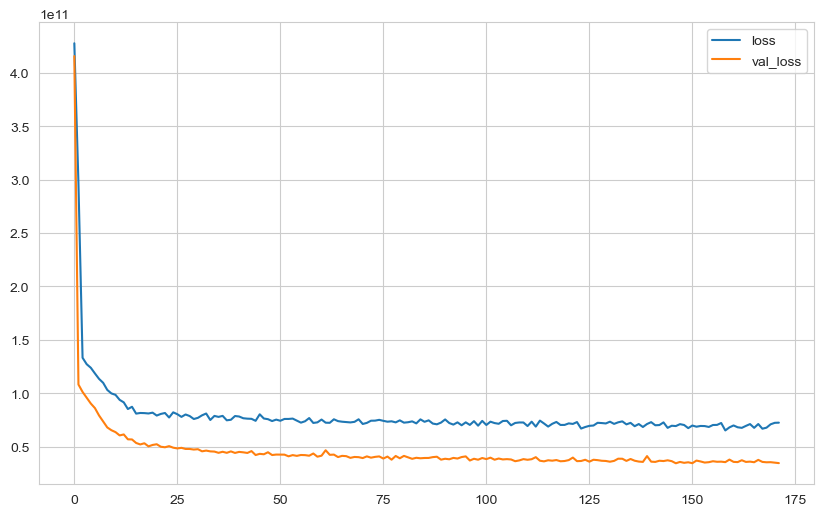

In [103]:
loss_df = pd.DataFrame(model.history.history)
loss_df.plot()

In [104]:
y_pred = model.predict(X_test)

68/68 [==============================] - 0s 811us/step


In [105]:
eval_metric(y_test, y_pred)

r2_score: 0.7787756413726612 
mae: 104299.88063512731 
mse: 28422852931.13811 
rmse: 168590.78542772768


## Saving Final Model and Scaler

In [106]:
import pickle
pickle.dump(scaler, open("scaler_kc_house", 'wb'))

In [107]:
tf.random.set_seed(seed)

model = Sequential()

model.add(Dense(24, activation = 'relu', input_dim = X_train.shape[1]))
model.add(Dense(24, activation = 'relu'))
model.add(Dense(12, activation = 'relu'))
model.add(Dense(6, activation = 'relu'))
model.add(Dense(1))

opt = Adam(lr = 0.003)
model.compile(optimizer = opt, loss = 'mse')

In [108]:
early_stop = EarlyStopping(monitor = "val_loss", mode = "min", verbose = 1, patience = 100, restore_best_weights = True)

In [109]:
model.fit(x = X_train, y = y_train, validation_data = (X_test, y_test), batch_size = 128, epochs = 1500,
         callbacks = [early_stop]
         )

Epoch 1/1500
152/152 [==============================] - 0s 1ms/step - loss: 426800119808.0000 - val_loss: 409361121280.0000
Epoch 2/1500
152/152 [==============================] - 0s 917us/step - loss: 315660664832.0000 - val_loss: 126727020544.0000
Epoch 3/1500
152/152 [==============================] - 0s 965us/step - loss: 97281622016.0000 - val_loss: 85677850624.0000
Epoch 4/1500
152/152 [==============================] - 0s 976us/step - loss: 90049609728.0000 - val_loss: 81739866112.0000
Epoch 5/1500
152/152 [==============================] - 0s 959us/step - loss: 85915238400.0000 - val_loss: 77438582784.0000
Epoch 6/1500
152/152 [==============================] - 0s 932us/step - loss: 81497948160.0000 - val_loss: 72982388736.0000
Epoch 7/1500
152/152 [==============================] - 0s 919us/step - loss: 76623667200.0000 - val_loss: 67959156736.0000
Epoch 8/1500
152/152 [==============================] - 0s 900us/step - loss: 71287717888.0000 - val_loss: 62828171264.0000
Epoch 

Epoch 67/1500
152/152 [==============================] - 0s 1ms/step - loss: 33238509568.0000 - val_loss: 29002184704.0000
Epoch 68/1500
152/152 [==============================] - 0s 1ms/step - loss: 33242490880.0000 - val_loss: 28908511232.0000
Epoch 69/1500
152/152 [==============================] - 0s 1ms/step - loss: 33127933952.0000 - val_loss: 28940003328.0000
Epoch 70/1500
152/152 [==============================] - 0s 1ms/step - loss: 33061173248.0000 - val_loss: 28831696896.0000
Epoch 71/1500
152/152 [==============================] - 0s 940us/step - loss: 33077088256.0000 - val_loss: 28763918336.0000
Epoch 72/1500
152/152 [==============================] - 0s 925us/step - loss: 32961144832.0000 - val_loss: 28813824000.0000
Epoch 73/1500
152/152 [==============================] - 0s 908us/step - loss: 33016524800.0000 - val_loss: 28852742144.0000
Epoch 74/1500
152/152 [==============================] - 0s 898us/step - loss: 32988430336.0000 - val_loss: 28674091008.0000
Epoch 75

152/152 [==============================] - 0s 896us/step - loss: 31126931456.0000 - val_loss: 26983673856.0000
Epoch 133/1500
152/152 [==============================] - 0s 892us/step - loss: 31177670656.0000 - val_loss: 26949249024.0000
Epoch 134/1500
152/152 [==============================] - 0s 909us/step - loss: 31079649280.0000 - val_loss: 26982459392.0000
Epoch 135/1500
152/152 [==============================] - 0s 964us/step - loss: 31204790272.0000 - val_loss: 26971916288.0000
Epoch 136/1500
152/152 [==============================] - 0s 900us/step - loss: 31016300544.0000 - val_loss: 27004733440.0000
Epoch 137/1500
152/152 [==============================] - 0s 922us/step - loss: 31112982528.0000 - val_loss: 26856806400.0000
Epoch 138/1500
152/152 [==============================] - 0s 906us/step - loss: 31008151552.0000 - val_loss: 26842513408.0000
Epoch 139/1500
152/152 [==============================] - 0s 895us/step - loss: 30932494336.0000 - val_loss: 26769160192.0000
Epoch 1

152/152 [==============================] - 0s 844us/step - loss: 29520631808.0000 - val_loss: 25719836672.0000
Epoch 198/1500
152/152 [==============================] - 0s 840us/step - loss: 29455222784.0000 - val_loss: 25634074624.0000
Epoch 199/1500
152/152 [==============================] - 0s 834us/step - loss: 29437063168.0000 - val_loss: 25705752576.0000
Epoch 200/1500
152/152 [==============================] - 0s 831us/step - loss: 29430947840.0000 - val_loss: 25735849984.0000
Epoch 201/1500
152/152 [==============================] - 0s 842us/step - loss: 29455642624.0000 - val_loss: 25573363712.0000
Epoch 202/1500
152/152 [==============================] - 0s 835us/step - loss: 29416028160.0000 - val_loss: 25636618240.0000
Epoch 203/1500
152/152 [==============================] - 0s 829us/step - loss: 29399064576.0000 - val_loss: 25623037952.0000
Epoch 204/1500
152/152 [==============================] - 0s 850us/step - loss: 29360607232.0000 - val_loss: 25602658304.0000
Epoch 2

152/152 [==============================] - 0s 851us/step - loss: 28394629120.0000 - val_loss: 24705202176.0000
Epoch 263/1500
152/152 [==============================] - 0s 845us/step - loss: 28334317568.0000 - val_loss: 24682934272.0000
Epoch 264/1500
152/152 [==============================] - 0s 862us/step - loss: 28425324544.0000 - val_loss: 24663209984.0000
Epoch 265/1500
152/152 [==============================] - 0s 845us/step - loss: 28322119680.0000 - val_loss: 24660766720.0000
Epoch 266/1500
152/152 [==============================] - 0s 861us/step - loss: 28328753152.0000 - val_loss: 24730120192.0000
Epoch 267/1500
152/152 [==============================] - 0s 846us/step - loss: 28360288256.0000 - val_loss: 24628914176.0000
Epoch 268/1500
152/152 [==============================] - 0s 849us/step - loss: 28351014912.0000 - val_loss: 24670474240.0000
Epoch 269/1500
152/152 [==============================] - 0s 845us/step - loss: 28436756480.0000 - val_loss: 24619307008.0000
Epoch 2

152/152 [==============================] - 0s 866us/step - loss: 27829338112.0000 - val_loss: 24119093248.0000
Epoch 328/1500
152/152 [==============================] - 0s 836us/step - loss: 27890026496.0000 - val_loss: 23908071424.0000
Epoch 329/1500
152/152 [==============================] - 0s 831us/step - loss: 27874703360.0000 - val_loss: 23965294592.0000
Epoch 330/1500
152/152 [==============================] - 0s 938us/step - loss: 27865171968.0000 - val_loss: 23859466240.0000
Epoch 331/1500
152/152 [==============================] - 0s 832us/step - loss: 27768745984.0000 - val_loss: 23872313344.0000
Epoch 332/1500
152/152 [==============================] - 0s 829us/step - loss: 27881728000.0000 - val_loss: 24073357312.0000
Epoch 333/1500
152/152 [==============================] - 0s 824us/step - loss: 27767103488.0000 - val_loss: 24004300800.0000
Epoch 334/1500
152/152 [==============================] - 0s 833us/step - loss: 27833151488.0000 - val_loss: 23952527360.0000
Epoch 3

152/152 [==============================] - 0s 874us/step - loss: 27506284544.0000 - val_loss: 23584331776.0000
Epoch 393/1500
152/152 [==============================] - 0s 853us/step - loss: 27499952128.0000 - val_loss: 23699841024.0000
Epoch 394/1500
152/152 [==============================] - 0s 844us/step - loss: 27525584896.0000 - val_loss: 23632889856.0000
Epoch 395/1500
152/152 [==============================] - 0s 840us/step - loss: 27516160000.0000 - val_loss: 23582062592.0000
Epoch 396/1500
152/152 [==============================] - 0s 838us/step - loss: 27519633408.0000 - val_loss: 23610406912.0000
Epoch 397/1500
152/152 [==============================] - 0s 852us/step - loss: 27552118784.0000 - val_loss: 23676905472.0000
Epoch 398/1500
152/152 [==============================] - 0s 848us/step - loss: 27525879808.0000 - val_loss: 23540230144.0000
Epoch 399/1500
152/152 [==============================] - 0s 839us/step - loss: 27505590272.0000 - val_loss: 23559890944.0000
Epoch 4

152/152 [==============================] - 0s 840us/step - loss: 27194136576.0000 - val_loss: 23096233984.0000
Epoch 458/1500
152/152 [==============================] - 0s 838us/step - loss: 27130050560.0000 - val_loss: 23083483136.0000
Epoch 459/1500
152/152 [==============================] - 0s 832us/step - loss: 27066935296.0000 - val_loss: 23097374720.0000
Epoch 460/1500
152/152 [==============================] - 0s 826us/step - loss: 27083042816.0000 - val_loss: 23216703488.0000
Epoch 461/1500
152/152 [==============================] - 0s 833us/step - loss: 27051694080.0000 - val_loss: 23056965632.0000
Epoch 462/1500
152/152 [==============================] - 0s 877us/step - loss: 27090143232.0000 - val_loss: 23041622016.0000
Epoch 463/1500
152/152 [==============================] - 0s 915us/step - loss: 27052836864.0000 - val_loss: 23126198272.0000
Epoch 464/1500
152/152 [==============================] - 0s 1ms/step - loss: 27088756736.0000 - val_loss: 22991751168.0000
Epoch 465

Epoch 523/1500
152/152 [==============================] - 0s 931us/step - loss: 21096306688.0000 - val_loss: 17972654080.0000
Epoch 524/1500
152/152 [==============================] - 0s 923us/step - loss: 21101565952.0000 - val_loss: 17909778432.0000
Epoch 525/1500
152/152 [==============================] - 0s 909us/step - loss: 21070077952.0000 - val_loss: 17928079360.0000
Epoch 526/1500
152/152 [==============================] - 0s 1ms/step - loss: 21047511040.0000 - val_loss: 17931651072.0000
Epoch 527/1500
152/152 [==============================] - 0s 933us/step - loss: 20955490304.0000 - val_loss: 18134509568.0000
Epoch 528/1500
152/152 [==============================] - 0s 936us/step - loss: 20879837184.0000 - val_loss: 17892898816.0000
Epoch 529/1500
152/152 [==============================] - 0s 911us/step - loss: 20870545408.0000 - val_loss: 17843699712.0000
Epoch 530/1500
152/152 [==============================] - 0s 906us/step - loss: 20886132736.0000 - val_loss: 18069528576

152/152 [==============================] - 0s 1ms/step - loss: 19342786560.0000 - val_loss: 16692844544.0000
Epoch 589/1500
152/152 [==============================] - 0s 1ms/step - loss: 19422705664.0000 - val_loss: 16652804096.0000
Epoch 590/1500
152/152 [==============================] - 0s 957us/step - loss: 19400892416.0000 - val_loss: 16619867136.0000
Epoch 591/1500
152/152 [==============================] - 0s 1ms/step - loss: 19366275072.0000 - val_loss: 16650117120.0000
Epoch 592/1500
152/152 [==============================] - 0s 1ms/step - loss: 19354425344.0000 - val_loss: 16661771264.0000
Epoch 593/1500
152/152 [==============================] - 0s 956us/step - loss: 19348873216.0000 - val_loss: 16611529728.0000
Epoch 594/1500
152/152 [==============================] - 0s 969us/step - loss: 19389593600.0000 - val_loss: 16607729664.0000
Epoch 595/1500
152/152 [==============================] - 0s 964us/step - loss: 19244109824.0000 - val_loss: 16612407296.0000
Epoch 596/1500


152/152 [==============================] - 0s 876us/step - loss: 18160881664.0000 - val_loss: 16062686208.0000
Epoch 654/1500
152/152 [==============================] - 0s 844us/step - loss: 18084519936.0000 - val_loss: 15812517888.0000
Epoch 655/1500
152/152 [==============================] - 0s 850us/step - loss: 18117775360.0000 - val_loss: 15859819520.0000
Epoch 656/1500
152/152 [==============================] - 0s 847us/step - loss: 18003300352.0000 - val_loss: 15713650688.0000
Epoch 657/1500
152/152 [==============================] - 0s 839us/step - loss: 17968328704.0000 - val_loss: 15778740224.0000
Epoch 658/1500
152/152 [==============================] - 0s 849us/step - loss: 17980264448.0000 - val_loss: 16476216320.0000
Epoch 659/1500
152/152 [==============================] - 0s 829us/step - loss: 17955309568.0000 - val_loss: 15794215936.0000
Epoch 660/1500
152/152 [==============================] - 0s 870us/step - loss: 17930764288.0000 - val_loss: 15629341696.0000
Epoch 6

152/152 [==============================] - 0s 914us/step - loss: 16580761600.0000 - val_loss: 14656275456.0000
Epoch 719/1500
152/152 [==============================] - 0s 926us/step - loss: 16598870016.0000 - val_loss: 14692554752.0000
Epoch 720/1500
152/152 [==============================] - 0s 914us/step - loss: 16563841024.0000 - val_loss: 14531368960.0000
Epoch 721/1500
152/152 [==============================] - 0s 1000us/step - loss: 16535272448.0000 - val_loss: 14649952256.0000
Epoch 722/1500
152/152 [==============================] - 0s 950us/step - loss: 16568253440.0000 - val_loss: 14829837312.0000
Epoch 723/1500
152/152 [==============================] - 0s 949us/step - loss: 16493902848.0000 - val_loss: 14523648000.0000
Epoch 724/1500
152/152 [==============================] - 0s 908us/step - loss: 16646637568.0000 - val_loss: 14621477888.0000
Epoch 725/1500
152/152 [==============================] - 0s 891us/step - loss: 16506467328.0000 - val_loss: 14563317760.0000
Epoch 

152/152 [==============================] - 0s 899us/step - loss: 15285765120.0000 - val_loss: 13699310592.0000
Epoch 784/1500
152/152 [==============================] - 0s 891us/step - loss: 15255414784.0000 - val_loss: 13540725760.0000
Epoch 785/1500
152/152 [==============================] - 0s 877us/step - loss: 15276053504.0000 - val_loss: 13434683392.0000
Epoch 786/1500
152/152 [==============================] - 0s 875us/step - loss: 15206719488.0000 - val_loss: 13409690624.0000
Epoch 787/1500
152/152 [==============================] - 0s 868us/step - loss: 15263091712.0000 - val_loss: 13397516288.0000
Epoch 788/1500
152/152 [==============================] - 0s 887us/step - loss: 15183114240.0000 - val_loss: 13530364928.0000
Epoch 789/1500
152/152 [==============================] - 0s 944us/step - loss: 15152252928.0000 - val_loss: 13585524736.0000
Epoch 790/1500
152/152 [==============================] - 0s 882us/step - loss: 15241157632.0000 - val_loss: 13306085376.0000
Epoch 7

152/152 [==============================] - 0s 862us/step - loss: 14191248384.0000 - val_loss: 12481506304.0000
Epoch 849/1500
152/152 [==============================] - 0s 861us/step - loss: 14139416576.0000 - val_loss: 12551867392.0000
Epoch 850/1500
152/152 [==============================] - 0s 863us/step - loss: 14146453504.0000 - val_loss: 12542685184.0000
Epoch 851/1500
152/152 [==============================] - 0s 873us/step - loss: 14146440192.0000 - val_loss: 12476379136.0000
Epoch 852/1500
152/152 [==============================] - 0s 863us/step - loss: 14163347456.0000 - val_loss: 12573644800.0000
Epoch 853/1500
152/152 [==============================] - 0s 846us/step - loss: 14211318784.0000 - val_loss: 12645343232.0000
Epoch 854/1500
152/152 [==============================] - 0s 851us/step - loss: 14061627392.0000 - val_loss: 12674651136.0000
Epoch 855/1500
152/152 [==============================] - 0s 851us/step - loss: 14170150912.0000 - val_loss: 12652297216.0000
Epoch 8

152/152 [==============================] - 0s 972us/step - loss: 13386678272.0000 - val_loss: 12197383168.0000
Epoch 914/1500
152/152 [==============================] - 0s 859us/step - loss: 13371896832.0000 - val_loss: 12708951040.0000
Epoch 915/1500
152/152 [==============================] - 0s 823us/step - loss: 13296950272.0000 - val_loss: 11915985920.0000
Epoch 916/1500
152/152 [==============================] - 0s 814us/step - loss: 13287511040.0000 - val_loss: 12372200448.0000
Epoch 917/1500
152/152 [==============================] - 0s 830us/step - loss: 13366948864.0000 - val_loss: 12198492160.0000
Epoch 918/1500
152/152 [==============================] - 0s 833us/step - loss: 13474668544.0000 - val_loss: 12109601792.0000
Epoch 919/1500
152/152 [==============================] - 0s 814us/step - loss: 13348147200.0000 - val_loss: 12137806848.0000
Epoch 920/1500
152/152 [==============================] - 0s 824us/step - loss: 13369794560.0000 - val_loss: 11954763776.0000
Epoch 9

152/152 [==============================] - 0s 1ms/step - loss: 12825234432.0000 - val_loss: 11923573760.0000
Epoch 979/1500
152/152 [==============================] - 0s 955us/step - loss: 12861694976.0000 - val_loss: 11635883008.0000
Epoch 980/1500
152/152 [==============================] - 0s 940us/step - loss: 12839922688.0000 - val_loss: 11658380288.0000
Epoch 981/1500
152/152 [==============================] - 0s 875us/step - loss: 12802478080.0000 - val_loss: 11654506496.0000
Epoch 982/1500
152/152 [==============================] - 0s 923us/step - loss: 12737391616.0000 - val_loss: 11802969088.0000
Epoch 983/1500
152/152 [==============================] - 0s 913us/step - loss: 12768172032.0000 - val_loss: 11570045952.0000
Epoch 984/1500
152/152 [==============================] - 0s 886us/step - loss: 12790077440.0000 - val_loss: 11633908736.0000
Epoch 985/1500
152/152 [==============================] - 0s 928us/step - loss: 12725517312.0000 - val_loss: 11539908608.0000
Epoch 986

Epoch 1043/1500
152/152 [==============================] - 0s 912us/step - loss: 12430836736.0000 - val_loss: 11569277952.0000
Epoch 1044/1500
152/152 [==============================] - 0s 899us/step - loss: 12481016832.0000 - val_loss: 11501806592.0000
Epoch 1045/1500
152/152 [==============================] - 0s 897us/step - loss: 12373345280.0000 - val_loss: 11573654528.0000
Epoch 1046/1500
152/152 [==============================] - 0s 888us/step - loss: 12532438016.0000 - val_loss: 11561508864.0000
Epoch 1047/1500
152/152 [==============================] - 0s 905us/step - loss: 12383245312.0000 - val_loss: 11615526912.0000
Epoch 1048/1500
152/152 [==============================] - 0s 892us/step - loss: 12385554432.0000 - val_loss: 11748537344.0000
Epoch 1049/1500
152/152 [==============================] - 0s 877us/step - loss: 12453100544.0000 - val_loss: 11487748096.0000
Epoch 1050/1500
152/152 [==============================] - 0s 927us/step - loss: 12492954624.0000 - val_loss: 1

152/152 [==============================] - 0s 929us/step - loss: 12163814400.0000 - val_loss: 11649793024.0000
Epoch 1108/1500
152/152 [==============================] - 0s 900us/step - loss: 12116802560.0000 - val_loss: 11521447936.0000
Epoch 1109/1500
152/152 [==============================] - 0s 882us/step - loss: 12108598272.0000 - val_loss: 11547643904.0000
Epoch 1110/1500
152/152 [==============================] - 0s 880us/step - loss: 12134279168.0000 - val_loss: 11837650944.0000
Epoch 1111/1500
152/152 [==============================] - 0s 928us/step - loss: 12197258240.0000 - val_loss: 11753448448.0000
Epoch 1112/1500
152/152 [==============================] - 0s 926us/step - loss: 12161639424.0000 - val_loss: 11659171840.0000
Epoch 1113/1500
152/152 [==============================] - 0s 931us/step - loss: 12189918208.0000 - val_loss: 11647130624.0000
Epoch 1114/1500
152/152 [==============================] - 0s 886us/step - loss: 12105069568.0000 - val_loss: 11531603968.0000


Epoch 1172/1500
152/152 [==============================] - 0s 906us/step - loss: 12014070784.0000 - val_loss: 11742785536.0000
Epoch 1173/1500
152/152 [==============================] - 0s 901us/step - loss: 11979009024.0000 - val_loss: 11884378112.0000
Epoch 1174/1500
152/152 [==============================] - 0s 1ms/step - loss: 11908363264.0000 - val_loss: 11723648000.0000
Epoch 1175/1500
152/152 [==============================] - 0s 899us/step - loss: 11854084096.0000 - val_loss: 11734864896.0000
Epoch 1176/1500
152/152 [==============================] - 0s 895us/step - loss: 11936540672.0000 - val_loss: 11625324544.0000
Epoch 1177/1500
152/152 [==============================] - 0s 973us/step - loss: 11863473152.0000 - val_loss: 11571943424.0000
Epoch 1178/1500
152/152 [==============================] - 0s 892us/step - loss: 11884002304.0000 - val_loss: 11539516416.0000
Epoch 1179/1500
152/152 [==============================] - 0s 913us/step - loss: 11885760512.0000 - val_loss: 115

<AxesSubplot:>

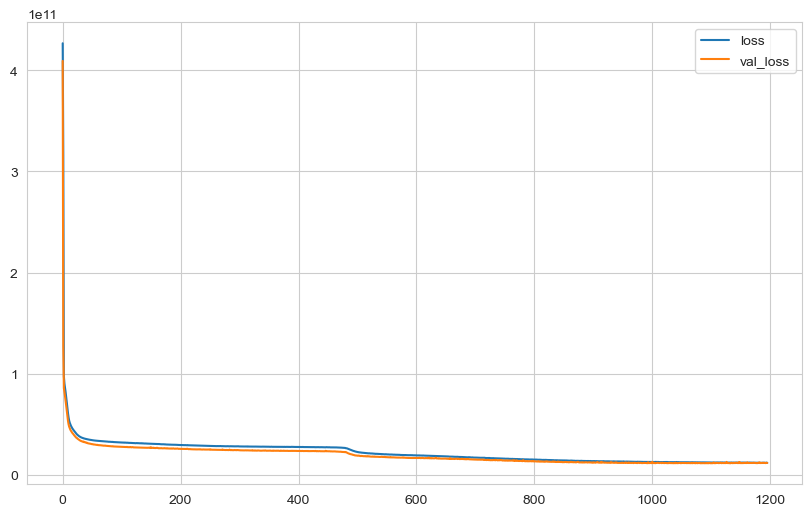

In [110]:
loss_df = pd.DataFrame(model.history.history)
loss_df.plot()

In [111]:
y_pred = model.predict(X_test)

68/68 [==============================] - 0s 572us/step


In [112]:
eval_metric(y_test, y_pred)

r2_score: 0.9114780408689825 
mae: 66216.830078125 
mse: 11373280235.36281 
rmse: 106645.58235277639


In [113]:
model.save('model_kc_house.h5')  # creates a HDF5 file 'my_model.h5'

## Loading Model and Scaler

In [114]:
from tensorflow.keras.models import load_model

In [115]:
model_kc_house = load_model('model_kc_house.h5')
scaler_kc_house = pickle.load(open("scaler_kc_house", "rb"))

## Prediction

In [116]:
single_house = df.drop('price', axis = 1).iloc[0:1, :]
single_house

,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,lat,long,sqft_living15,sqft_lot15,built|renovated
0,3,1.000,1180,5650,1.000,0,0,3,7,1180,0,47.511,-122.257,1340,5650,1955.000


In [117]:
single_house = scaler_kc_house.transform(single_house)
single_house

array([[0.2       , 0.06666667, 0.06150342, 0.00307611, 0.        ,
        0.        , 0.        , 0.5       , 0.4       , 0.08960177,
        0.        , 0.57149751, 0.21760797, 0.15304348, 0.00573322,
        0.47826087]])

In [118]:
model_kc_house.predict(single_house)

1/1 [==============================] - 0s 37ms/step


array([[225349.1]], dtype=float32)

In [119]:
df.iloc[0][0]

221900.0

## Comparison with ML

### Linear Regression

In [120]:
from sklearn.linear_model import LinearRegression 

In [121]:
ln_model = LinearRegression()
ln_model.fit(X_train, y_train)
y_pred = ln_model.predict(X_test)
eval_metric(y_test, y_pred)

r2_score: 0.7054431219005433 
mae: 124715.14810190474 
mse: 37844597575.166885 
rmse: 194536.87973021177


### Random Forest

In [122]:
from sklearn.ensemble import RandomForestRegressor

In [123]:
rf_model = RandomForestRegressor(random_state = seed)
rf_model.fit(X_train, y_train)
y_pred = rf_model.predict(X_test)
eval_metric(y_test, y_pred)

r2_score: 0.8912532816836695 
mae: 64653.2709236993 
mse: 13971752480.727938 
rmse: 118202.16783429963


___

<p style="text-align: center;"><img src="https://docs.google.com/uc?id=1lY0Uj5R04yMY3-ZppPWxqCr5pvBLYPnV" class="img-fluid" alt="CLRSWY"></p>

___